In [1]:
# !pip install --ignore-installed --trusted-host pypi.org --trusted-host pypi.python.org --trusted-host files.pythonhosted.org seaborn --user

In [8]:
import os
import numpy as np
import pandas as pd
from datetime import datetime, timedelta

from sklearn.linear_model import LinearRegression
from statsmodels.tsa.arima_model import ARIMA
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.tsa.stattools import adfuller
from datetime import datetime
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingRegressor

from tqdm import tqdm
from statsmodels.tsa.stattools import adfuller
import statsmodels.graphics.tsaplots as spl
import statsmodels.graphics.gofplots as gpl
import scipy.stats as ss

import seaborn as sns
import matplotlib.pyplot as plt
#import yfinance as yf
plt.style.use("bmh")
plt.rcParams['font.family'] = 'DejaVu Sans'

import warnings
warnings.filterwarnings("ignore")

#from arch import arch_model 

# 1. Загрузка данных

In [3]:
bonds_file_names = ['/SU26205RMFS3_rates.csv', 
                 '/SU26209RMFS5_rates.csv',
                 '/SU26212RMFS9_rates.csv',
                 '/SU26215RMFS2_rates.csv', 
                 '/SU26217RMFS8_rates.csv']

bonds_names = [x[1:len('SU26209RMFS5')+1] for x in bonds_file_names]

shares_file_names = ["/SBER.ME.csv", 
                  '/GAZP.ME.csv', 
                  '/YNDX.ME.csv',
                  '/MGNT.ME.csv', 
                  '/GMKN.ME.csv',
                  '/MTSS.ME.csv', 
                  '/PIKK.ME.csv', 
                  '/AFLT.ME.csv', 
                  '/POLY.ME.csv', 
                  '/RSTI.ME.csv']

shares_names = [x[1:5] for x in shares_file_names]

currencies_file_names = ['/D_USD.csv',
                      '/D_CNY.csv']

currencies_names = [x[3:6] for x in currencies_file_names]

risks_file_names = ['/IMOEX.ME.csv',
                    '/BZ=F.csv',
                    '/RTS.csv',
                   '/JPY.csv',
                    '/EUR.csv',
                    '/GBP.csv']   

risks_names = [x.split('/')[1].split('.csv')[0] for x in risks_file_names]

bonds_folder = 'bonds'
shares_folder = 'shares'
currencies_folder = 'currencies'
risks_folder = 'risk_factors'

bonds = [bonds_folder + x for x in bonds_file_names]
shares = [shares_folder + x for x in shares_file_names]
currencies = [currencies_folder + x for x in currencies_file_names]
risks = [risks_folder + x for x in risks_file_names]
zero_bonds = risks_folder + '/zero_bonds.csv'
metals = risks_folder + '/refined_precious_metals.xlsx'

In [4]:
def load_df(bonds=bonds, bonds_names=bonds_names, 
            shares=shares, shares_names=shares_names,
            currencies=currencies, currencies_names=currencies_names,
            risks=risks, risks_names=risks_names,
            zero_bonds=zero_bonds, metals=metals):
#     Основной df
    main_df = pd.read_csv(bonds[0], index_col='<DATE>')
    main_df.index = pd.to_datetime(main_df.index, format='%Y%m%d')
    main_df = main_df[[]]
    main_df.index.names = ['Date']
#     Загрузка облигаций
    for i in range(len(bonds)):
        df = pd.read_csv(bonds[i], index_col='<DATE>')
        df.index = pd.to_datetime(df.index, format='%Y%m%d')
        df = df[['<CLOSE>']].rename(columns={'<CLOSE>': bonds_names[i]})
        df.index.names = ['Date']
        main_df = main_df.join(df, how='left', on='Date')
#     Загрузка акций
    for i in range(len(shares)):
        df = pd.read_csv(shares[i], index_col='Date')
        df.index = pd.to_datetime(df.index)
        df = df[['Adj Close']].rename(columns={'Adj Close': shares_names[i]})
        main_df = main_df.join(df, how='left', on='Date')
#     Загрузка валют
    for i in range(len(currencies)):
        df = pd.read_csv(currencies[i], index_col='Date')
        df.index = pd.to_datetime(df.index)
        df = df[['Adj Close']].rename(columns={'Adj Close': currencies_names[i]})
        main_df = main_df.join(df, how='left', on='Date')
#     Загрузка рисков
    for i in range(len(risks)):
        df = pd.read_csv(risks[i], index_col='Date')
        df.index = pd.to_datetime(df.index)
        df = df[['Adj Close']].rename(columns={'Adj Close': risks_names[i]})
        main_df = main_df.join(df, how='left', on='Date')
#     Загрузка металлов
    df = pd.read_excel(metals, index_col='Date')
    df.index = pd.to_datetime(df.index)
    main_df = main_df.join(df, how='left', on='Date')

#     Загрузка zero_bonds
    df = pd.read_csv(zero_bonds, index_col='Date')
    df.index = pd.to_datetime(df.index)
    main_df = main_df.join(df, how='left', on='Date')

#     Заполнение пропусков
    main_df.fillna(method='ffill', inplace=True)
    main_df.fillna(method='backfill', inplace=True)

    return main_df

In [5]:
prices = load_df()

bonds = prices.iloc[:, 0:5]
shares = prices.iloc[:, 5:15]
currencies = prices.iloc[:, 15:17]
risk_factors = prices.iloc[:, 17:]

# 2. Описательная статистика риск-факторов

In [9]:
def plot_cor_matrix(risk_factors: pd.DataFrame) -> None:
    corr_matrix = risk_factors.corr()
    
    fig = plt.figure(figsize=(14, 14))
    ax = plt.subplot()
    
    sns.heatmap(corr_matrix, annot=True)
    
    plt.show()

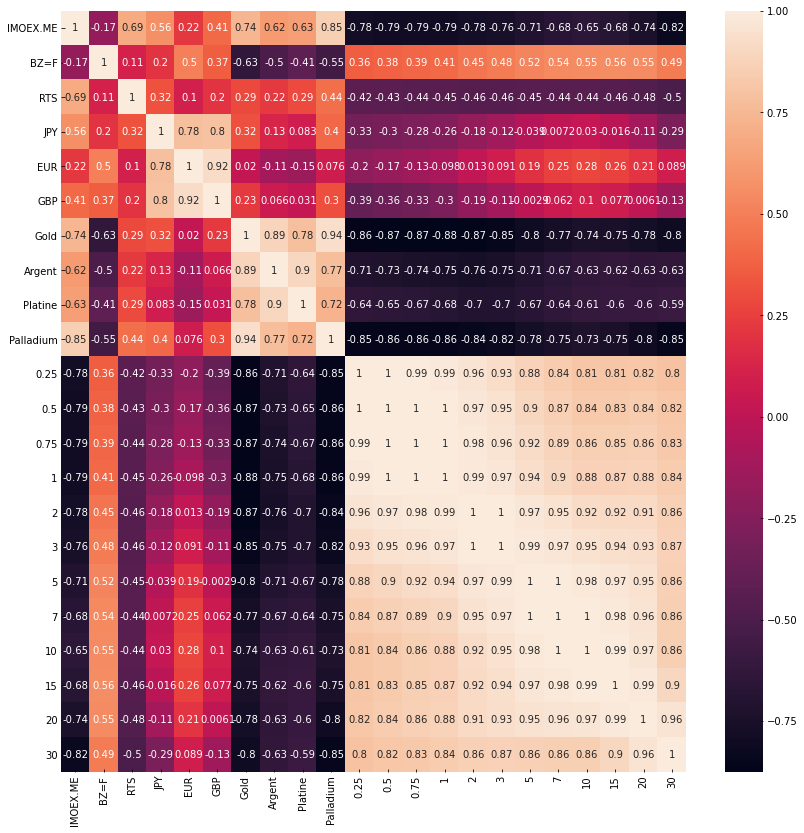

In [10]:
plot_cor_matrix(risk_factors)

In [11]:
def risk_factor_describe(risk_factor: pd.Series) -> None:
    risk_factor_name = risk_factor.name
    print(f"{'=' * 10} {risk_factor_name.upper()} {'=' * 10}")
    print(f"mean: {np.round(np.mean(risk_factor), 2)}")
    print(f"std: {np.round(np.std(risk_factor), 2)}")
    print(f"min: {np.round(np.min(risk_factor), 2)}")
    print(f"max: {np.round(np.max(risk_factor), 2)}")
    adfuller_pv = adfuller(risk_factor)[1]
    print(
        f"The Augmented Dickey-Fuller test, p-value: {adfuller_pv}, "
        f"series is {'non ' if adfuller_pv >= 0.05 else ''}stationary"
    )
    risk_factor_change = np.log(risk_factor).diff().iloc[1:]
    adfuller_pv = adfuller(risk_factor_change)[1]
    print(
        f"The Augmented Dickey-Fuller test for log diff, p-value: {adfuller_pv}, "
        f"series is {'non ' if adfuller_pv >= 0.05 else ''}stationary"
    )
    _, norm_pv = ss.shapiro(risk_factor_change)
    print(
        f"The Shapiro–Wilk test, p-value: {norm_pv}, "
        f"series is {'' if norm_pv >= 0.05 else 'non '}normal"
    )
    fig = plt.figure(figsize=(15, 15))
    
    ax = plt.subplot(511)
    sns.lineplot(x=risk_factor.index, y=risk_factor, ax=ax)
    plt.title('Price')
    
    ax = plt.subplot(512)
    sns.lineplot(x=risk_factor_change.index, y=risk_factor_change, ax=ax)
    plt.title('Price log diff')
    
    ax = plt.subplot(525)
    spl.plot_acf(risk_factor_change, lags=20, ax=ax)
    
    ax = plt.subplot(526)
    spl.plot_pacf(risk_factor_change, lags=20, ax=ax)
    
    ax = plt.subplot(527)
    normal_dist = gpl.ProbPlot(risk_factor_change, fit=True)
    normal_dist.qqplot(line='r', ax=ax)
    plt.title('Q-Q')
    
    ax = plt.subplot(528)
    normal_dist.ppplot(line='45', ax=ax)
    plt.title('P-P')
    
    ax = plt.subplot(529)
    normal_dist.probplot(line='r', ax=ax)
    plt.title('Prob')
    
    ax = plt.subplot(5, 2, 10)
    sns.distplot(risk_factor_change, ax=ax, label='true', norm_hist=True, kde=False)
    plt.title('Distribution')
    
    params_norm = ss.norm.fit(risk_factor_change)
    params_t = ss.t.fit(risk_factor_change)
    vals, grid, _ = ax.hist(risk_factor_change, 50, density=True, color='blue')
    ax.plot(grid, ss.norm(*params_norm).pdf(grid), label='norm')
    ax.plot(grid, ss.t(*params_t).pdf(grid),label='Student')
    
    plt.legend()
    plt.tight_layout()
    plt.show()

========== IMOEX.ME ==========
mean: 2478.9
std: 360.04
min: 1817.82
max: 3289.02
The Augmented Dickey-Fuller test, p-value: 0.8341597619769606, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 1.6222236112353364e-25, series is stationary
The Shapiro–Wilk test, p-value: 3.8964872967045697e-28, series is non normal


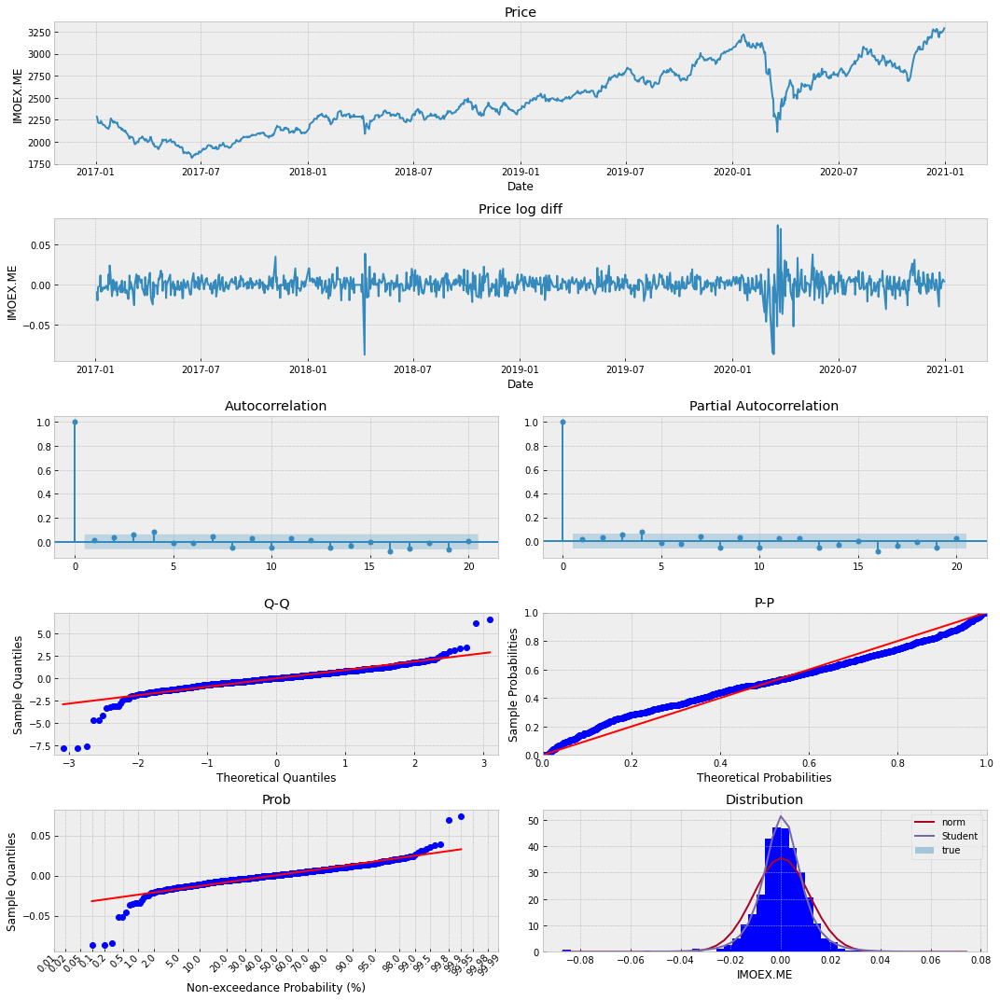

========== BZ=F ==========
mean: 58.54
std: 12.76
min: 19.33
max: 86.29
The Augmented Dickey-Fuller test, p-value: 0.29558777916016676, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 4.899160511490788e-07, series is stationary
The Shapiro–Wilk test, p-value: 1.8850017623074667e-35, series is non normal


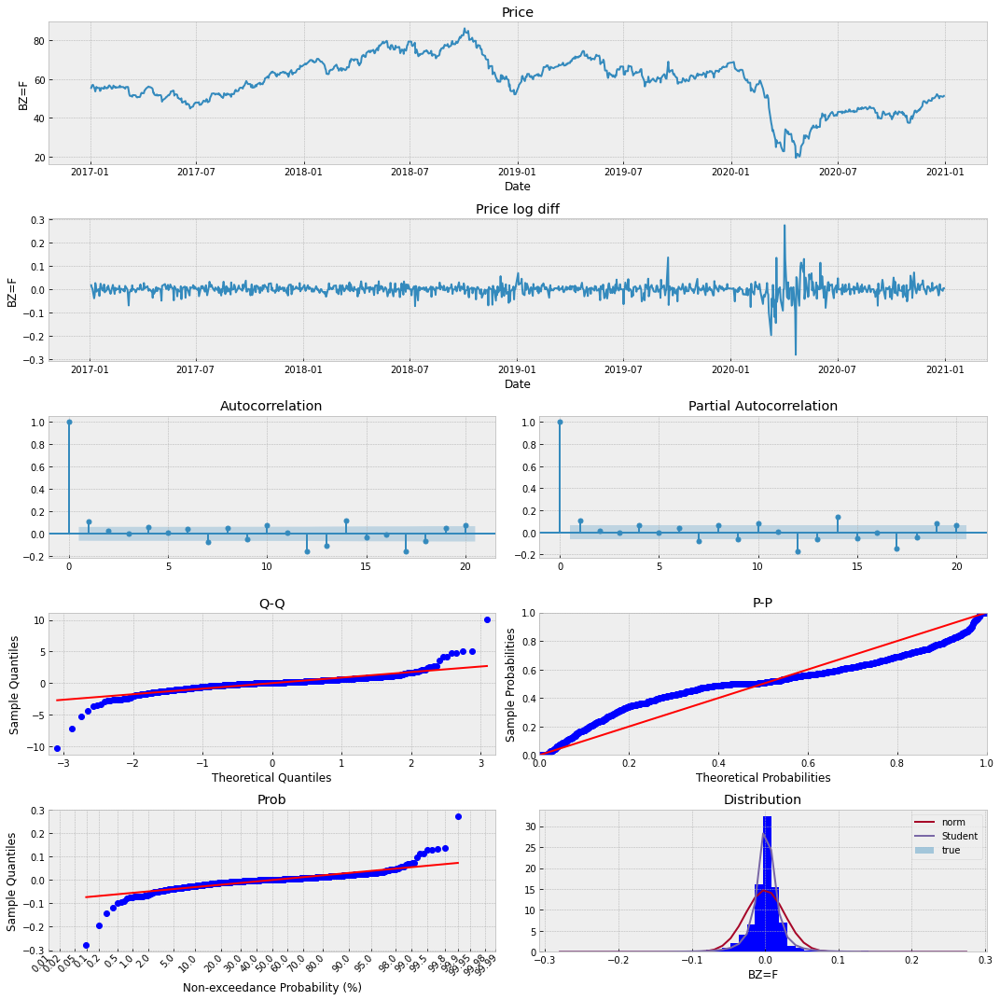

========== RTS ==========
mean: 1208.12
std: 133.8
min: 832.26
max: 1646.6
The Augmented Dickey-Fuller test, p-value: 0.2724882464435697, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 3.303404341708835e-19, series is stationary
The Shapiro–Wilk test, p-value: 1.7915367690328323e-37, series is non normal


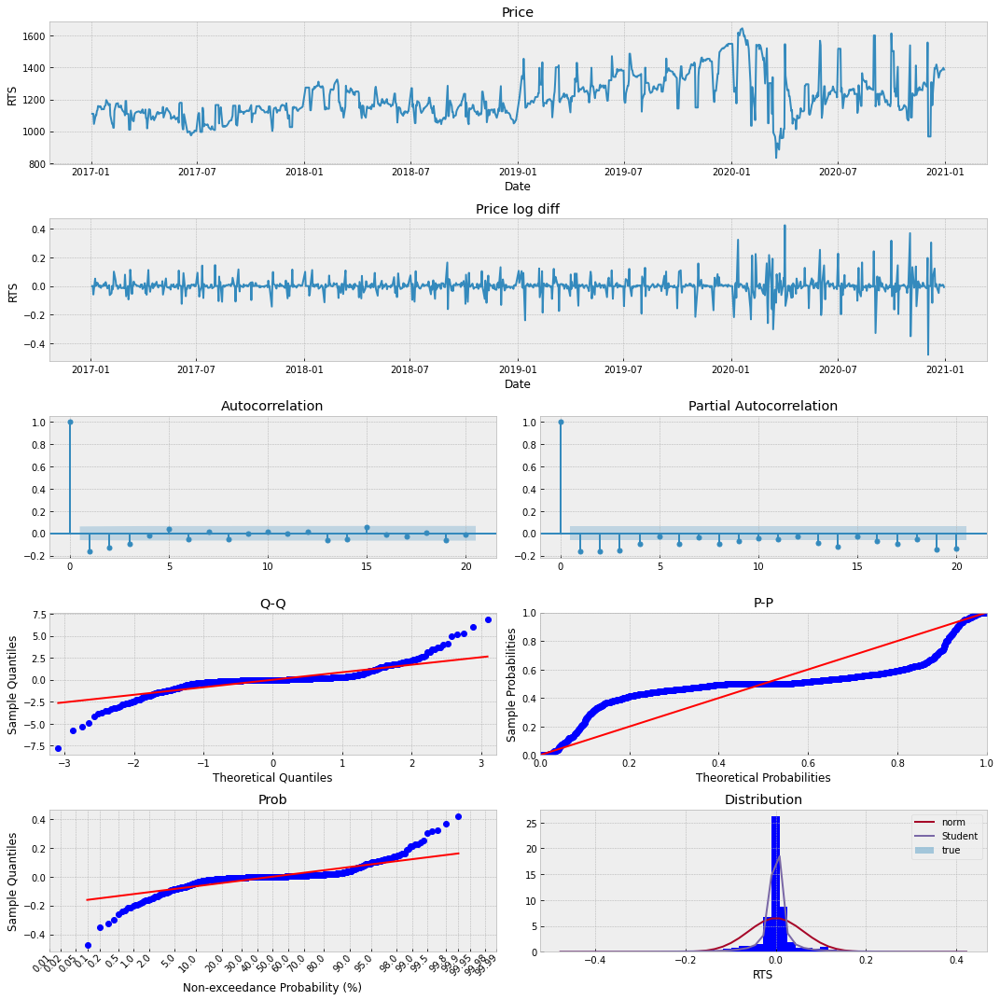

========== JPY ==========
mean: 0.56
std: 0.03
min: 0.5
max: 0.64
The Augmented Dickey-Fuller test, p-value: 0.21231121567861028, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 1.205409046415594e-25, series is stationary
The Shapiro–Wilk test, p-value: 1.2512403652192727e-23, series is non normal


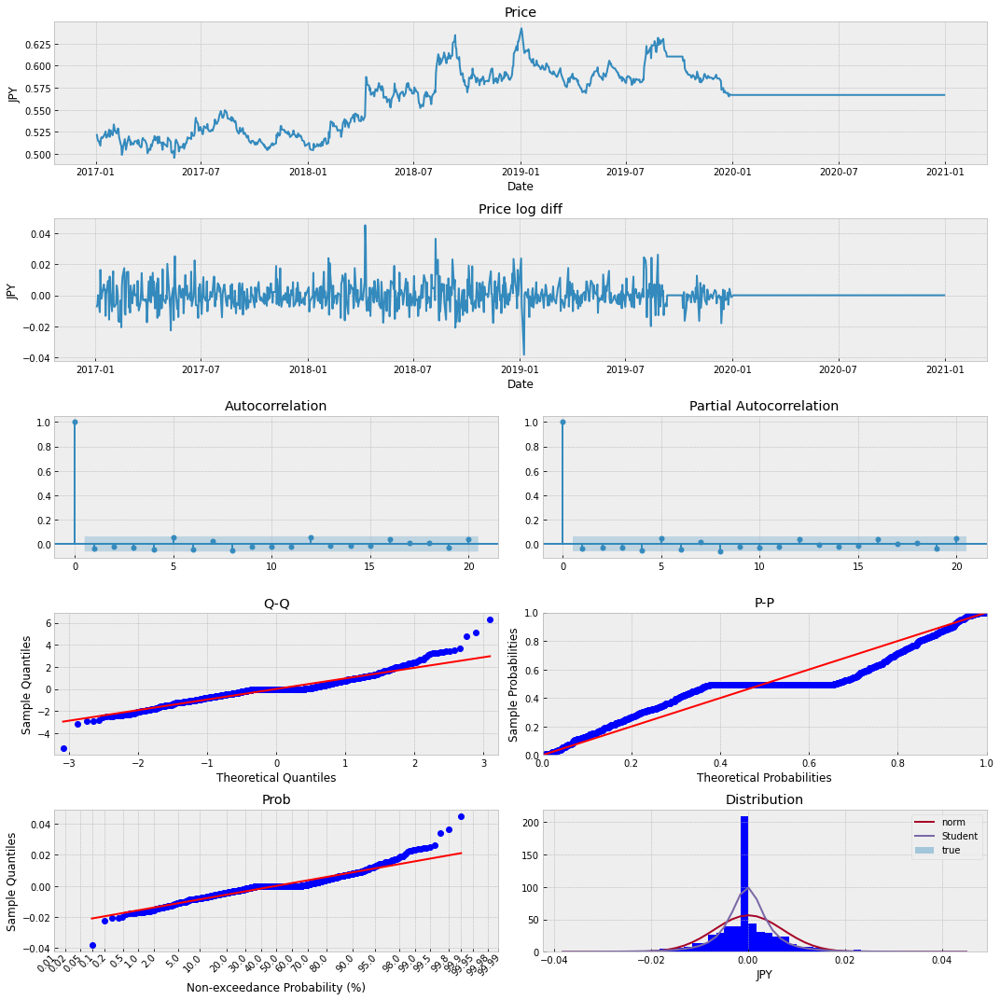

========== EUR ==========
mean: 70.47
std: 4.0
min: 59.57
max: 81.81
The Augmented Dickey-Fuller test, p-value: 0.24174034466135724, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 0.0, series is stationary
The Shapiro–Wilk test, p-value: 6.021887063064245e-25, series is non normal


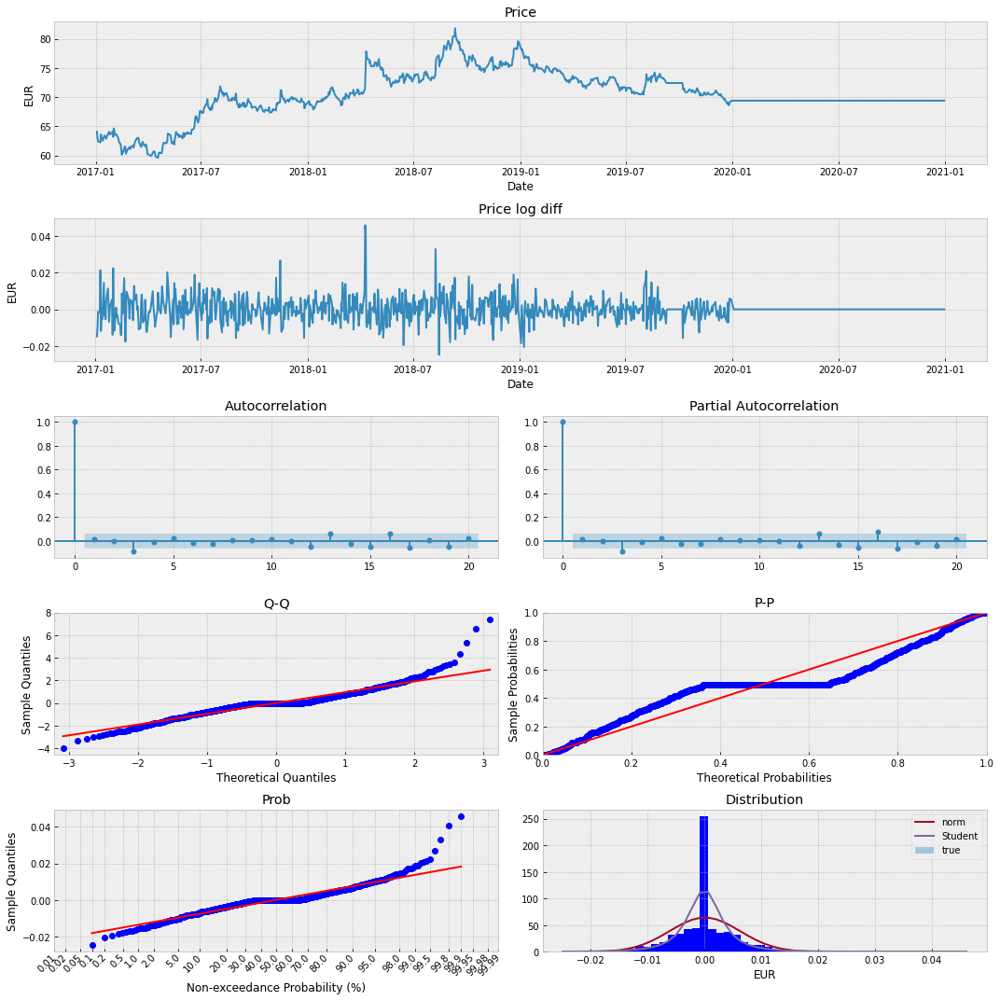

========== GBP ==========
mean: 80.67
std: 4.09
min: 69.6
max: 91.88
The Augmented Dickey-Fuller test, p-value: 0.15797404042581398, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 0.0, series is stationary
The Shapiro–Wilk test, p-value: 2.9390716711128583e-21, series is non normal


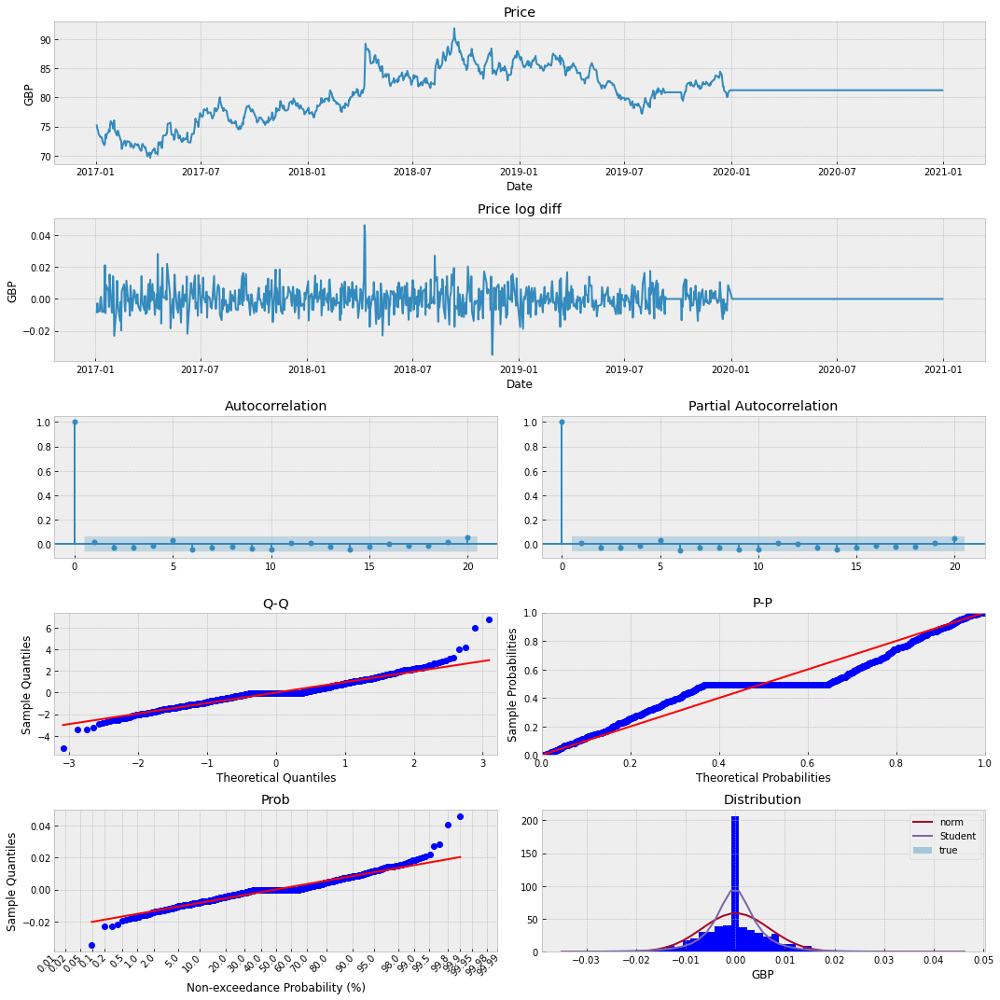

========== GOLD ==========
mean: 2983.32
std: 746.72
min: 2232.16
max: 4887.7
The Augmented Dickey-Fuller test, p-value: 0.970707983245699, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 5.603819012885486e-30, series is stationary
The Shapiro–Wilk test, p-value: 3.6942589349393875e-29, series is non normal


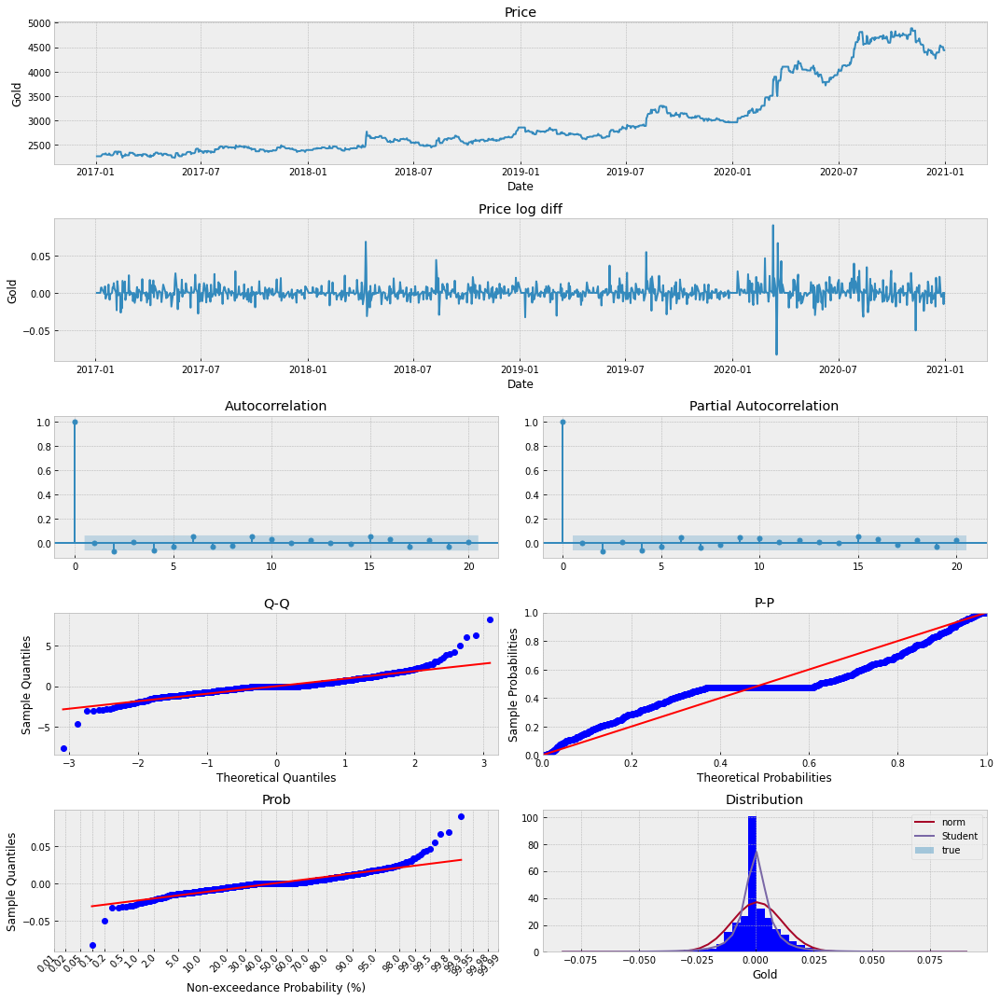

========== ARGENT ==========
mean: 36.29
std: 9.17
min: 29.51
max: 68.34
The Augmented Dickey-Fuller test, p-value: 0.943344377504336, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 2.831574317955673e-11, series is stationary
The Shapiro–Wilk test, p-value: 1.2357259466744523e-32, series is non normal


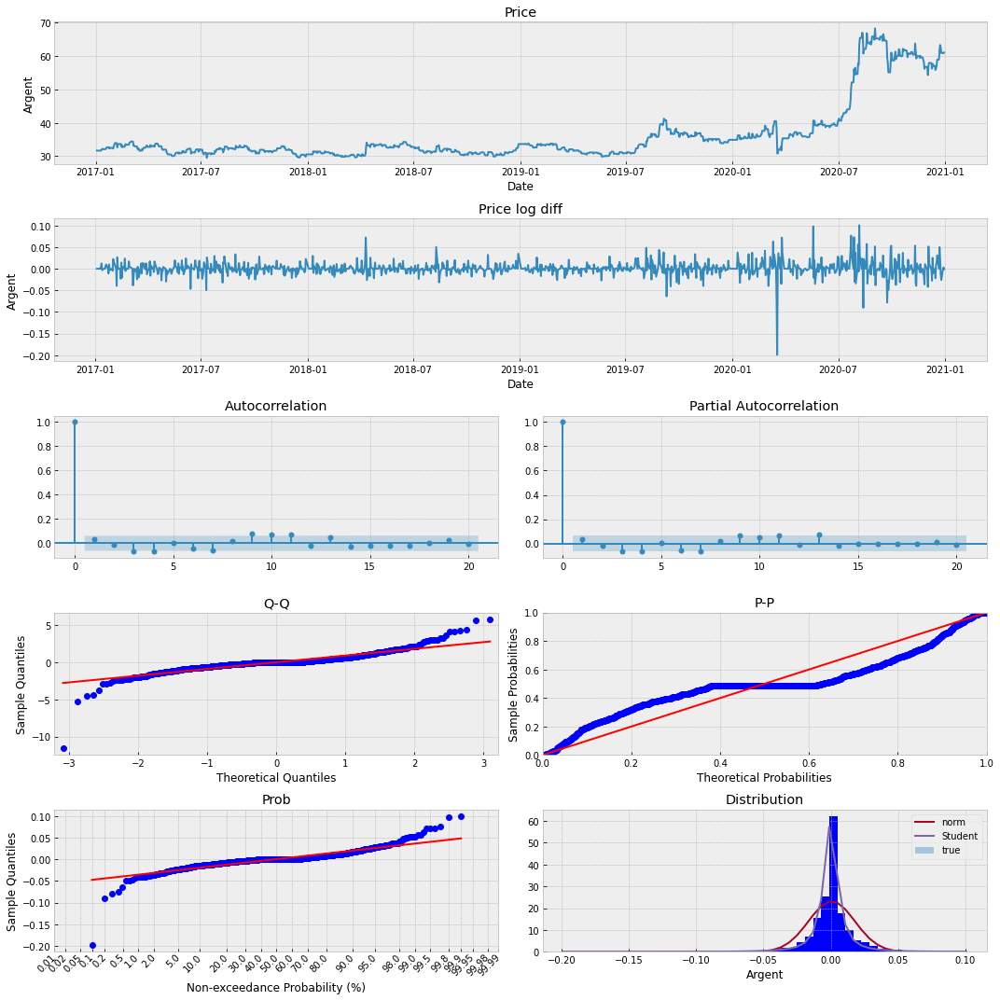

========== PLATINE ==========
mean: 1848.12
std: 170.84
min: 1522.76
max: 2473.81
The Augmented Dickey-Fuller test, p-value: 0.950871410902307, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 3.5592267710500554e-27, series is stationary
The Shapiro–Wilk test, p-value: 2.853462578111193e-32, series is non normal


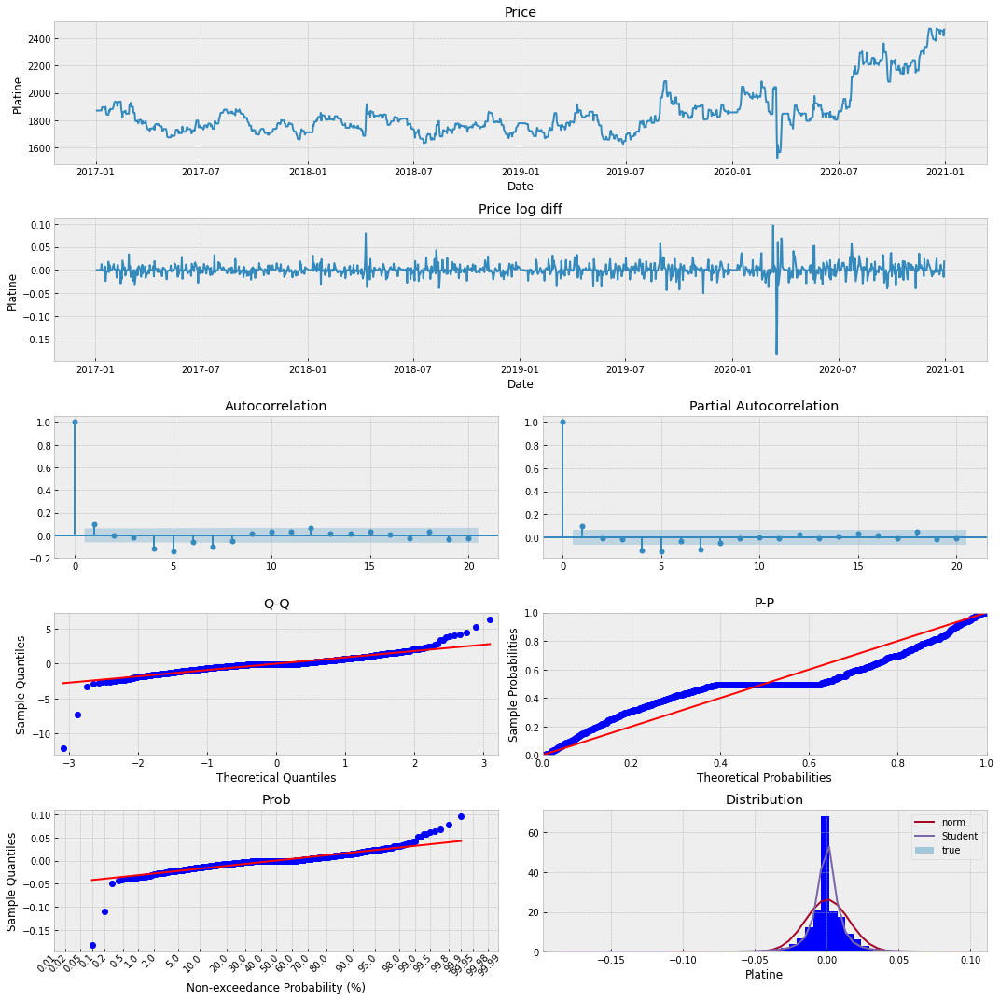

========== PALLADIUM ==========
mean: 2999.15
std: 1393.67
min: 1379.06
max: 6098.86
The Augmented Dickey-Fuller test, p-value: 0.9819060821375514, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 9.595576564741633e-25, series is stationary
The Shapiro–Wilk test, p-value: 1.5966714053280207e-33, series is non normal


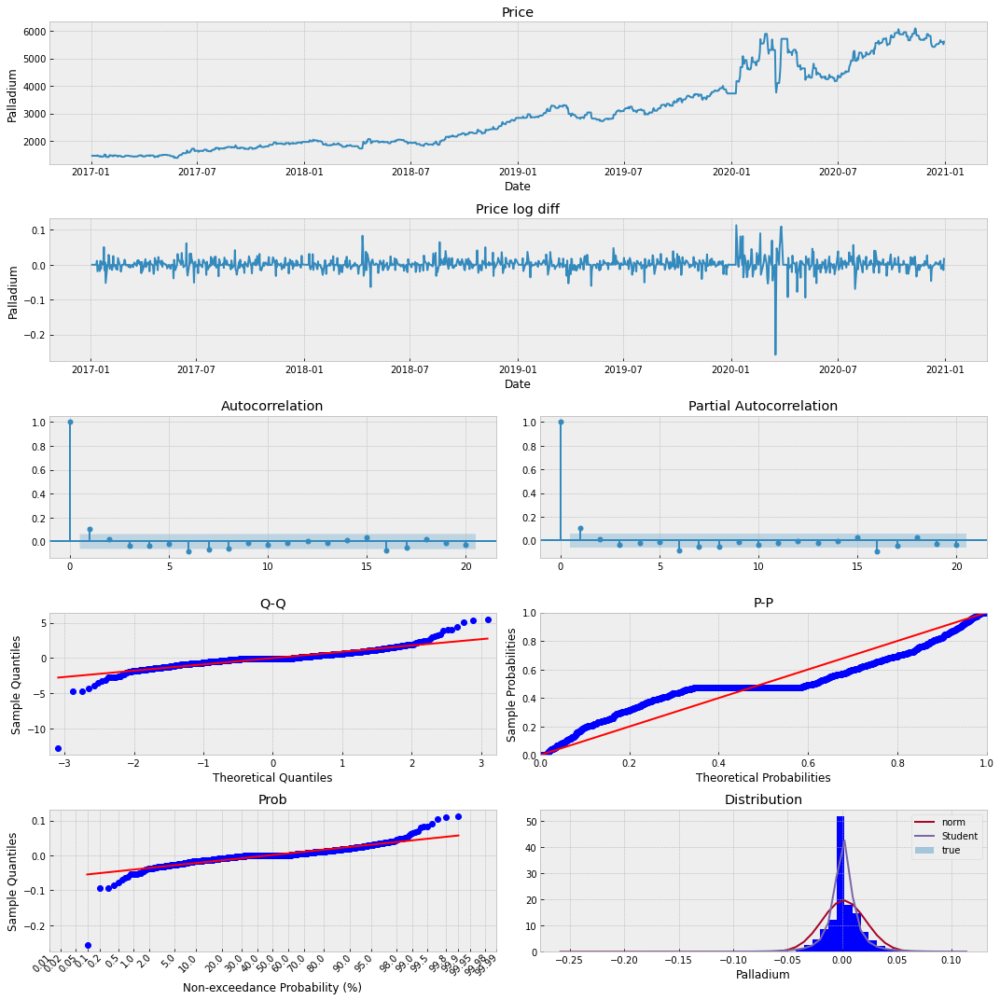

========== 0.25 ==========
mean: 6.62
std: 1.46
min: 3.68
max: 9.82
The Augmented Dickey-Fuller test, p-value: 0.9145344034994012, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 0.0, series is stationary
The Shapiro–Wilk test, p-value: 1.6398283726809957e-31, series is non normal


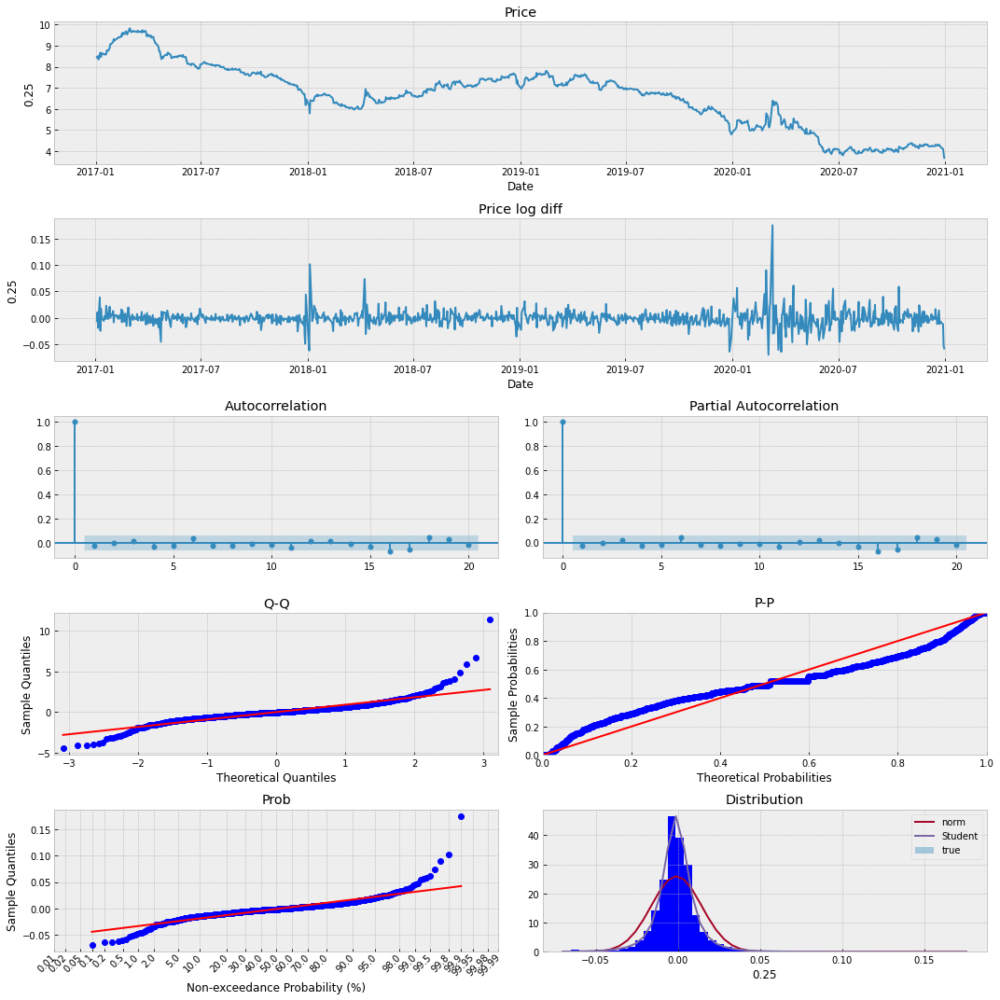

========== 0.5 ==========
mean: 6.64
std: 1.42
min: 3.87
max: 9.51
The Augmented Dickey-Fuller test, p-value: 0.9143124925299795, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 0.0, series is stationary
The Shapiro–Wilk test, p-value: 8.288271371567377e-32, series is non normal


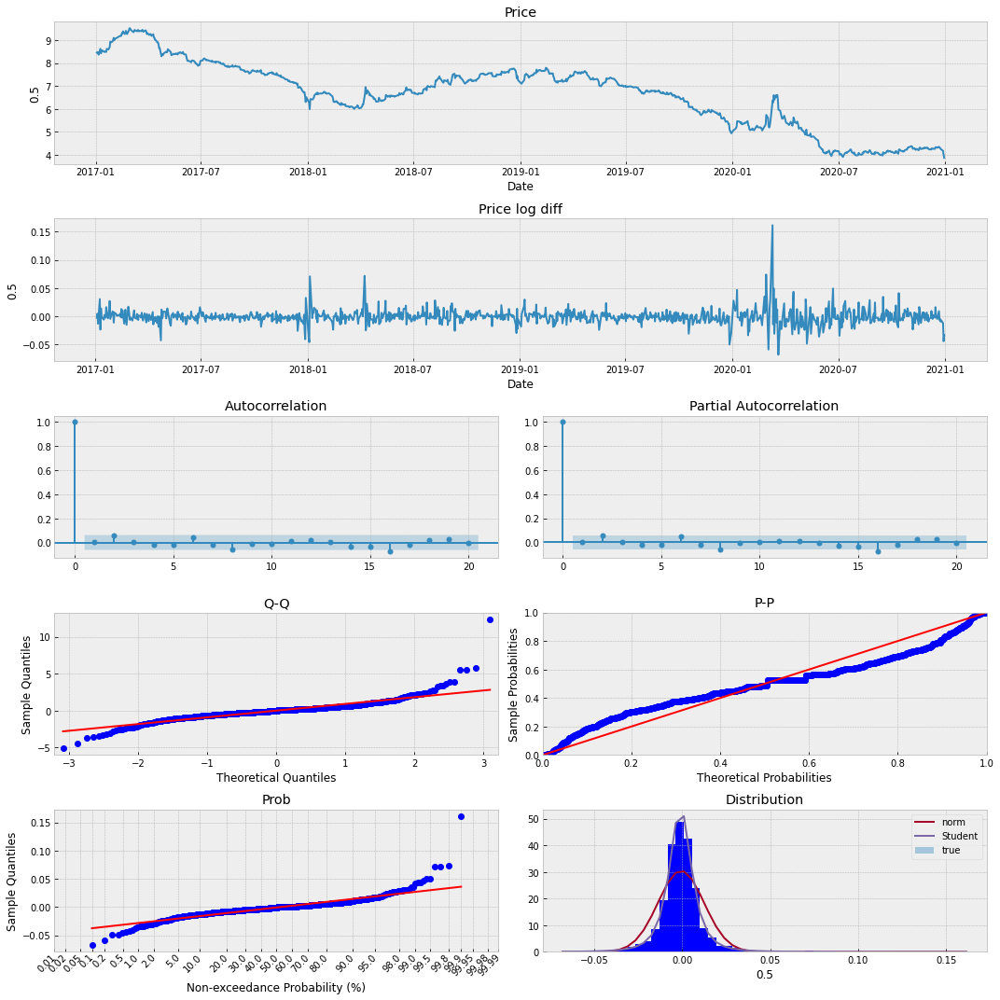

========== 0.75 ==========
mean: 6.66
std: 1.38
min: 4.02
max: 9.27
The Augmented Dickey-Fuller test, p-value: 0.9021490752383663, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 0.0, series is stationary
The Shapiro–Wilk test, p-value: 2.5358980037907518e-33, series is non normal


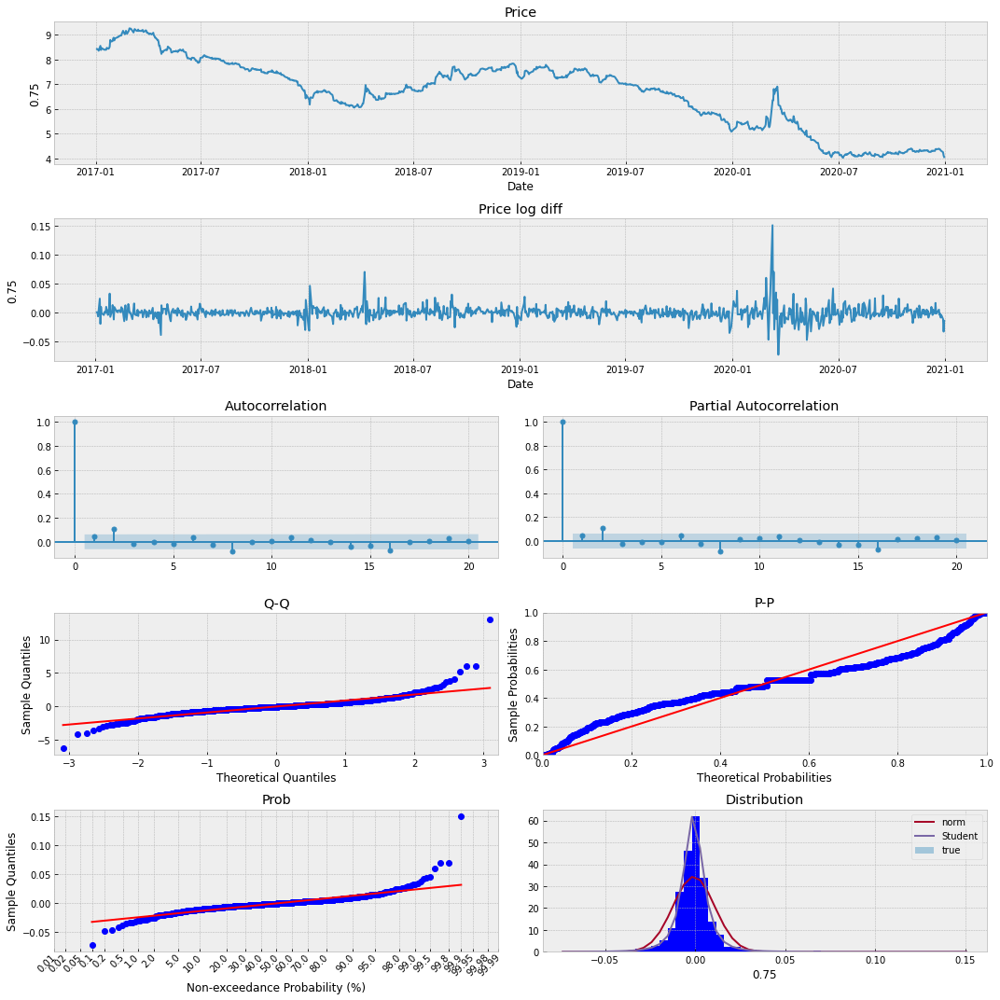

========== 1 ==========
mean: 6.69
std: 1.35
min: 4.12
max: 9.1
The Augmented Dickey-Fuller test, p-value: 0.9242625911753577, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 7.1724906631493e-22, series is stationary
The Shapiro–Wilk test, p-value: 4.57275251980006e-35, series is non normal


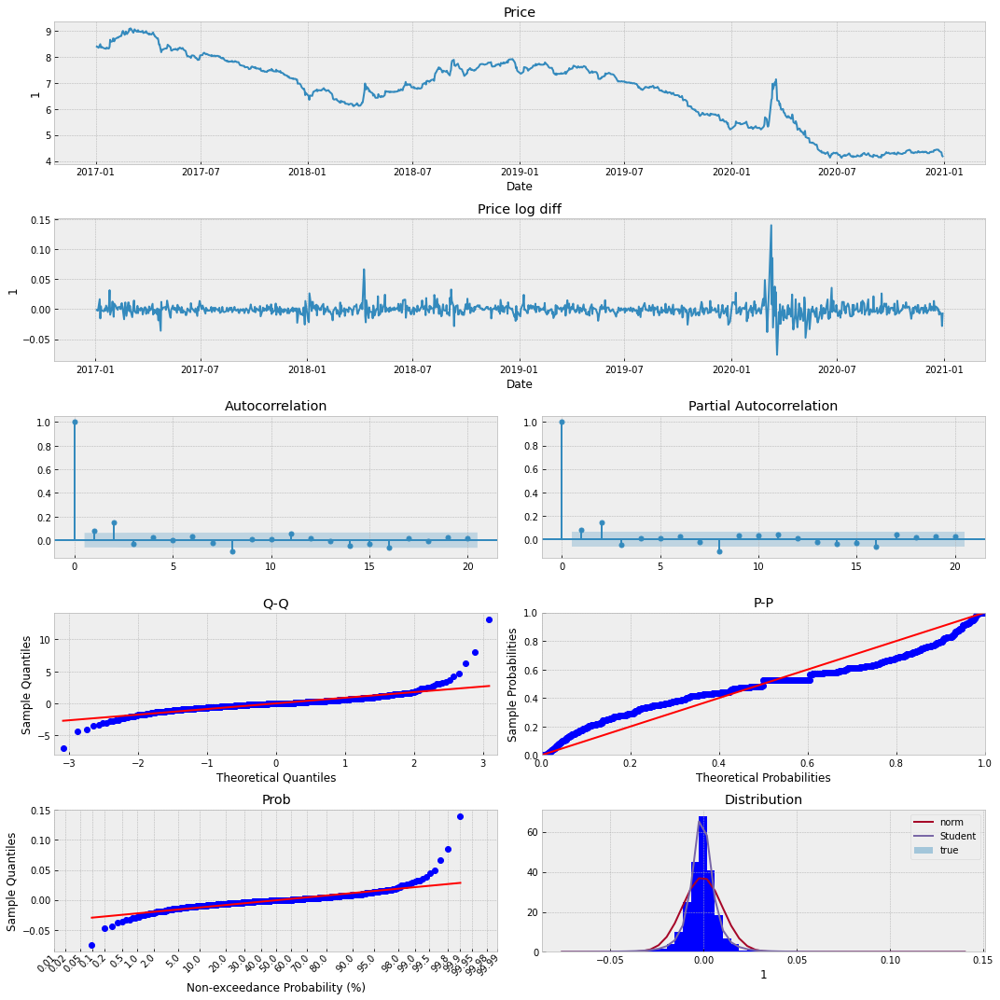

========== 2 ==========
mean: 6.8
std: 1.25
min: 4.38
max: 8.68
The Augmented Dickey-Fuller test, p-value: 0.9097458147543342, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 2.6419301658138054e-21, series is stationary
The Shapiro–Wilk test, p-value: 1.5035454679428952e-38, series is non normal


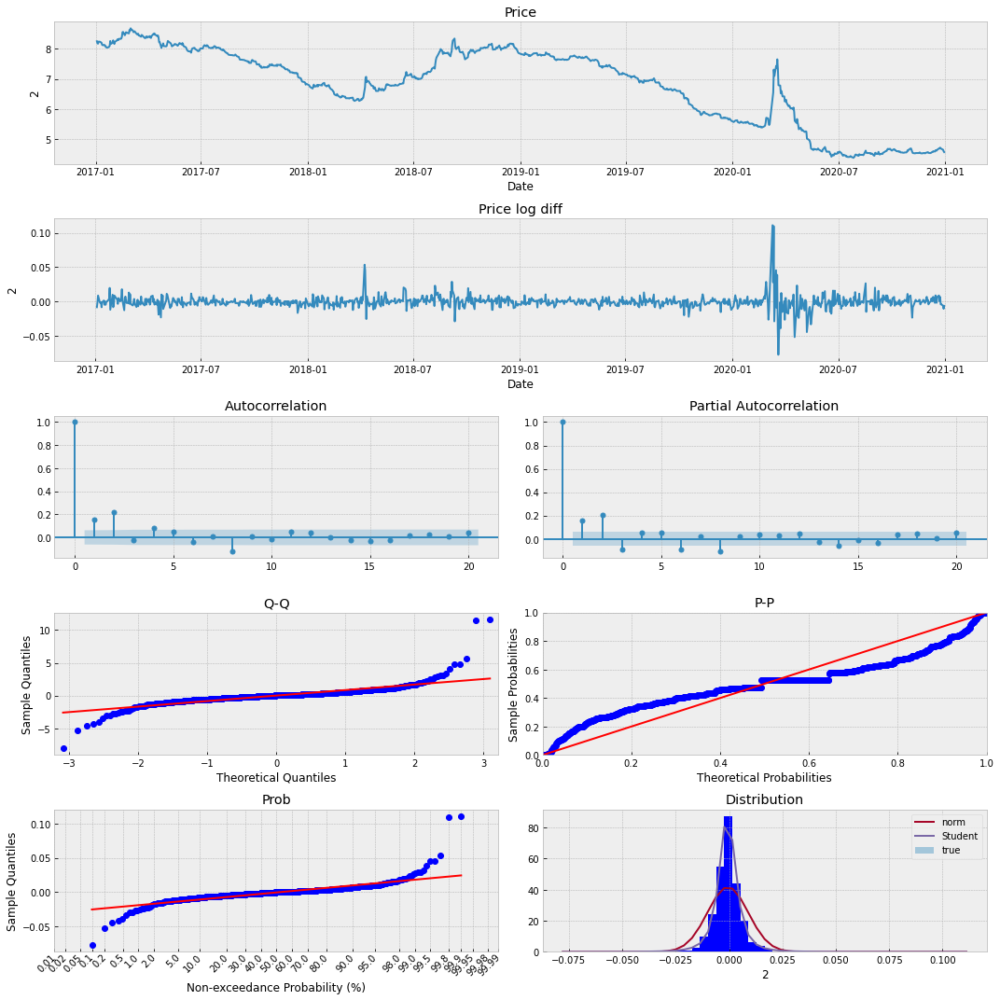

========== 3 ==========
mean: 6.9
std: 1.18
min: 4.6
max: 8.65
The Augmented Dickey-Fuller test, p-value: 0.871143923257319, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 1.596540747497765e-20, series is stationary
The Shapiro–Wilk test, p-value: 1.4787309664509692e-37, series is non normal


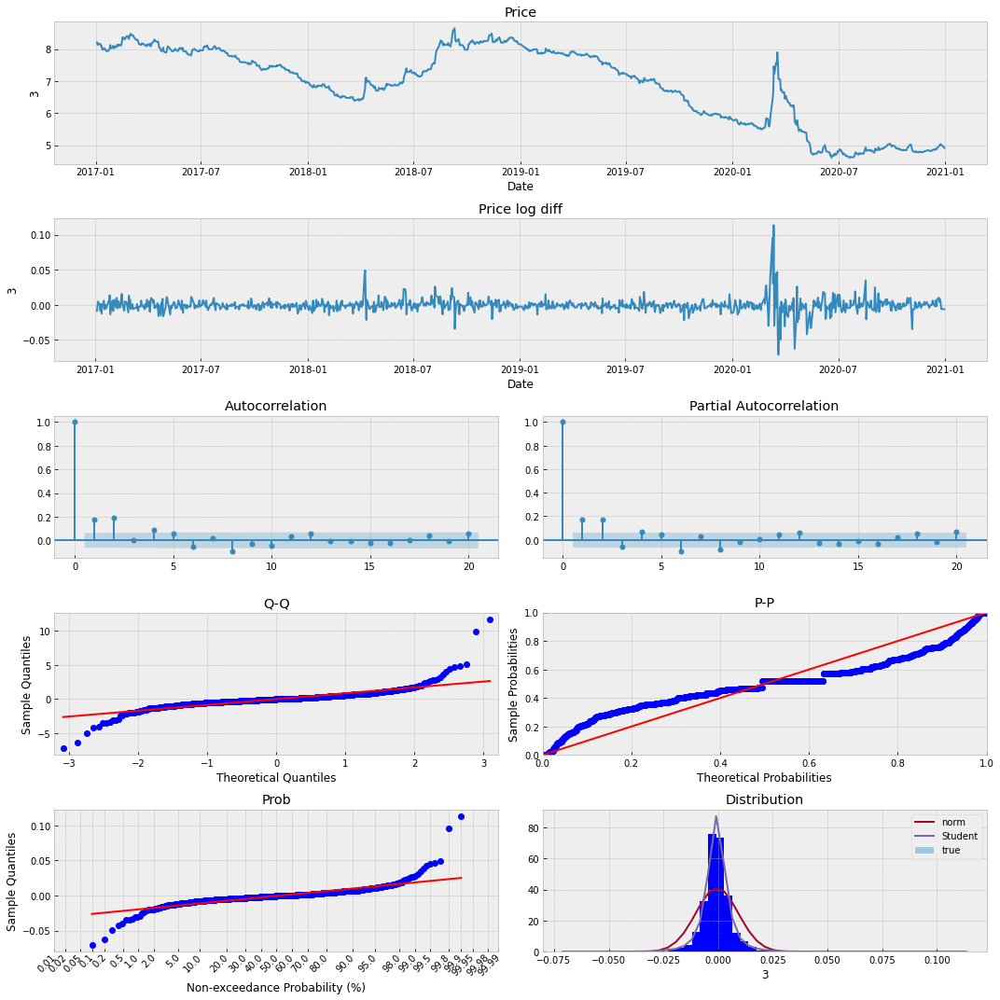

========== 5 ==========
mean: 7.09
std: 1.06
min: 4.95
max: 9.02
The Augmented Dickey-Fuller test, p-value: 0.7514487725858088, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 2.5843196791238506e-14, series is stationary
The Shapiro–Wilk test, p-value: 4.5505639159845875e-35, series is non normal


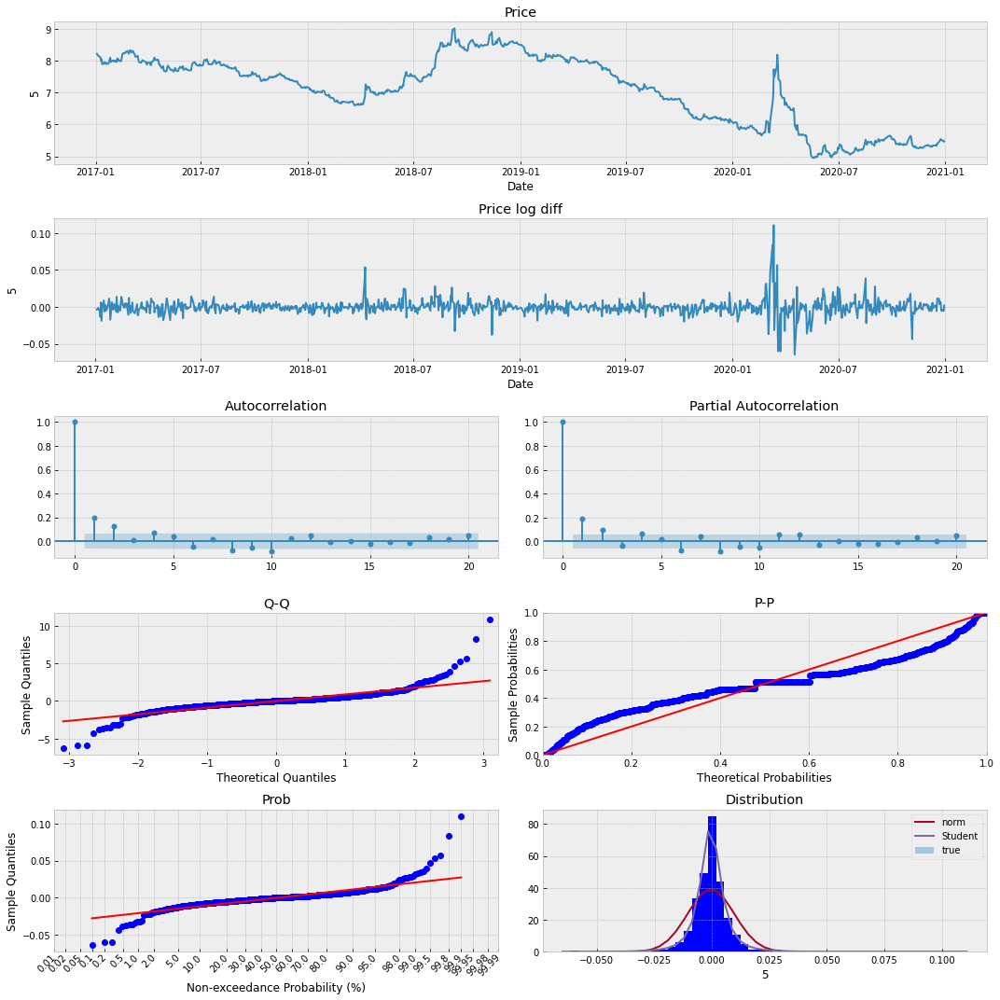

========== 7 ==========
mean: 7.24
std: 0.97
min: 5.22
max: 9.19
The Augmented Dickey-Fuller test, p-value: 0.7010514948984194, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 1.567642884904565e-17, series is stationary
The Shapiro–Wilk test, p-value: 6.275568528051752e-34, series is non normal


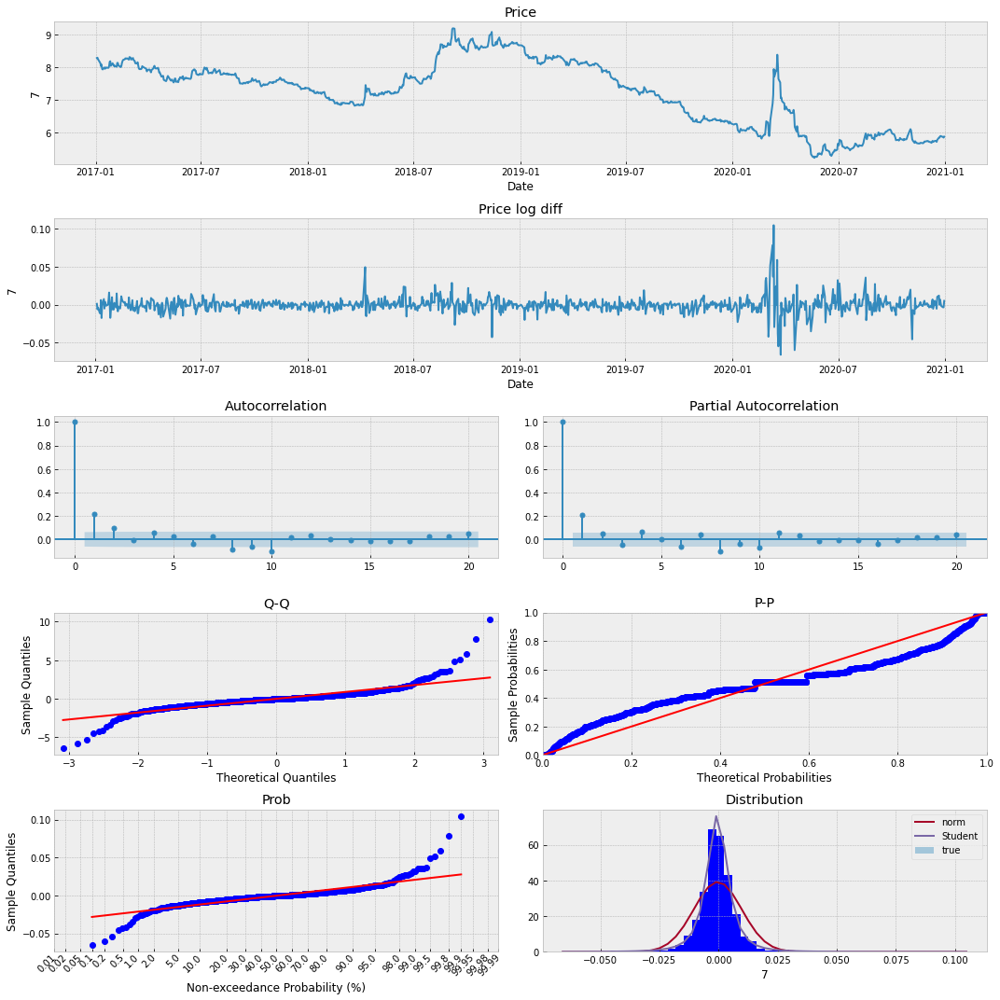

========== 10 ==========
mean: 7.43
std: 0.88
min: 5.59
max: 9.29
The Augmented Dickey-Fuller test, p-value: 0.6629083396090492, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 1.1617756186882382e-17, series is stationary
The Shapiro–Wilk test, p-value: 5.602457503896871e-34, series is non normal


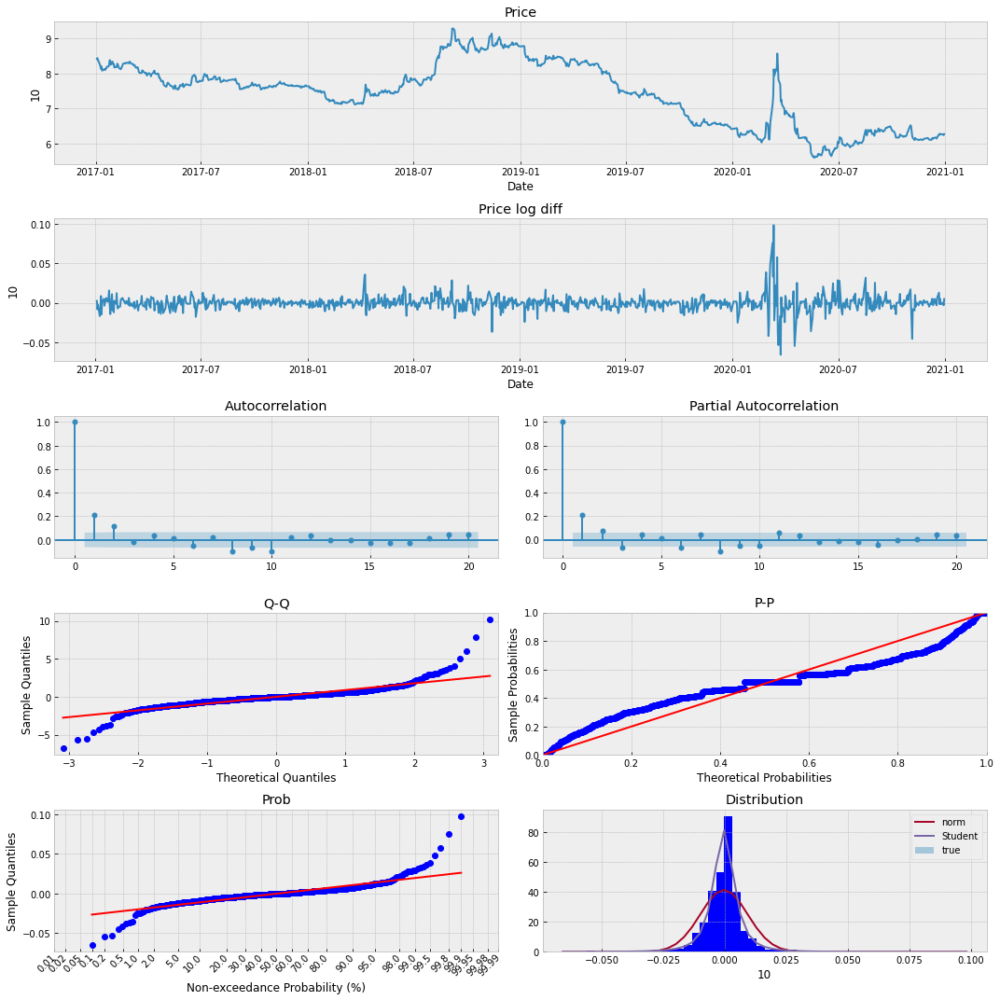

========== 15 ==========
mean: 7.66
std: 0.81
min: 5.97
max: 9.26
The Augmented Dickey-Fuller test, p-value: 0.6139933089641, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 9.774613818203393e-18, series is stationary
The Shapiro–Wilk test, p-value: 2.623877951946443e-32, series is non normal


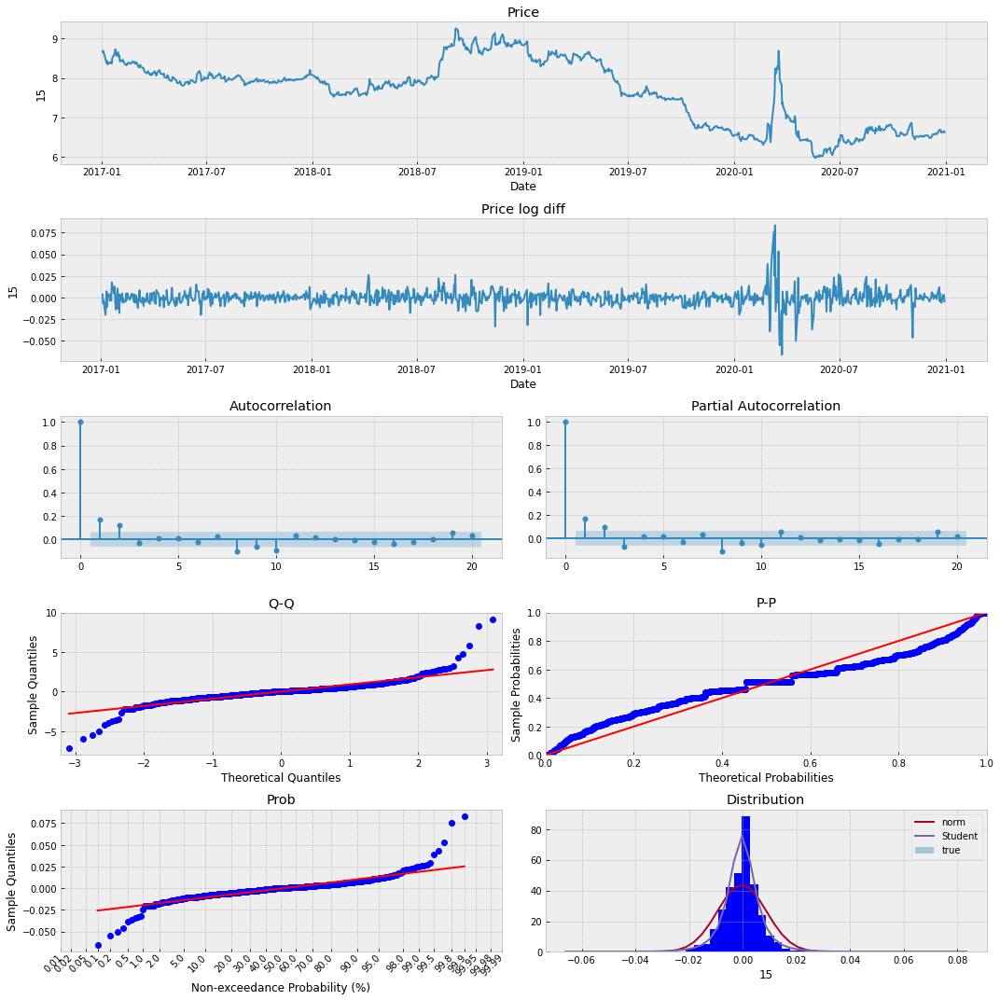

========== 20 ==========
mean: 7.84
std: 0.79
min: 6.17
max: 9.2
The Augmented Dickey-Fuller test, p-value: 0.601541555046818, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 5.036880165630602e-18, series is stationary
The Shapiro–Wilk test, p-value: 1.0485727086849075e-29, series is non normal


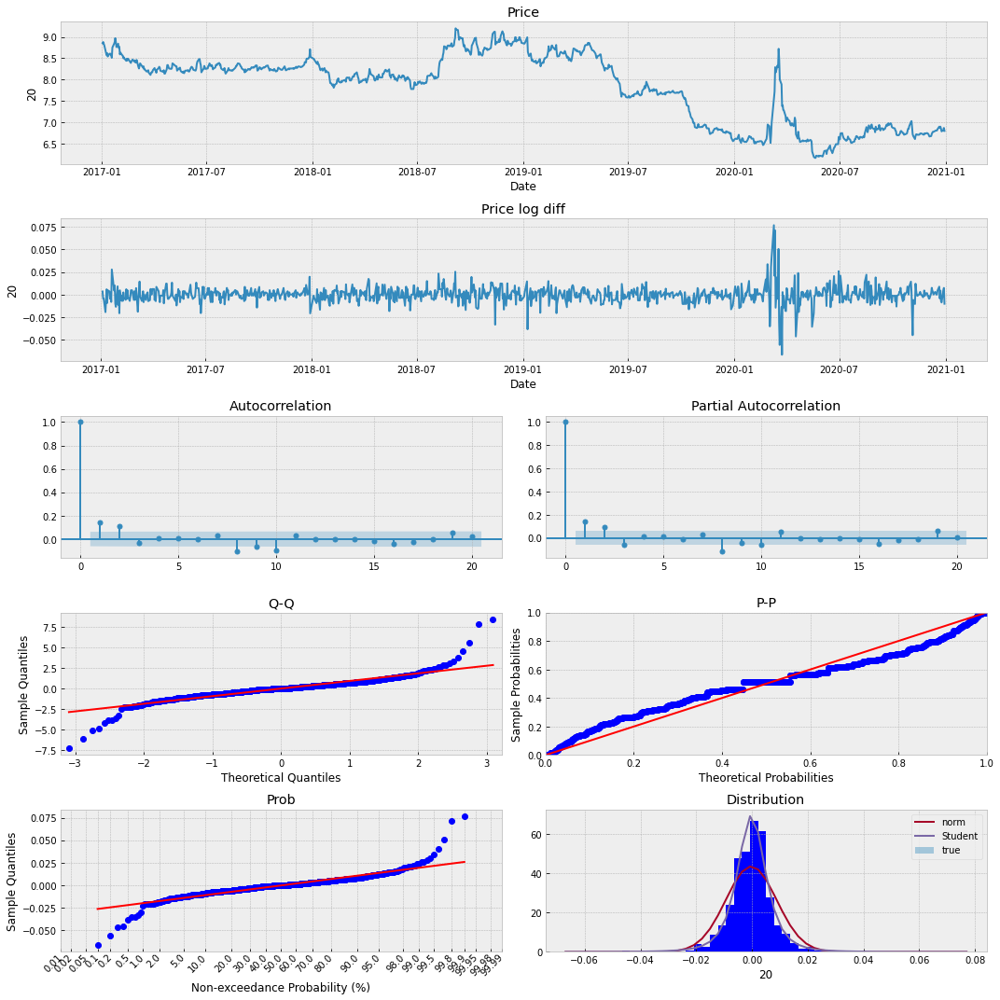

========== 30 ==========
mean: 8.09
std: 0.85
min: 6.37
max: 9.57
The Augmented Dickey-Fuller test, p-value: 0.6419590589333192, series is non stationary
The Augmented Dickey-Fuller test for log diff, p-value: 1.6271056205574663e-20, series is stationary
The Shapiro–Wilk test, p-value: 4.461842885951126e-26, series is non normal


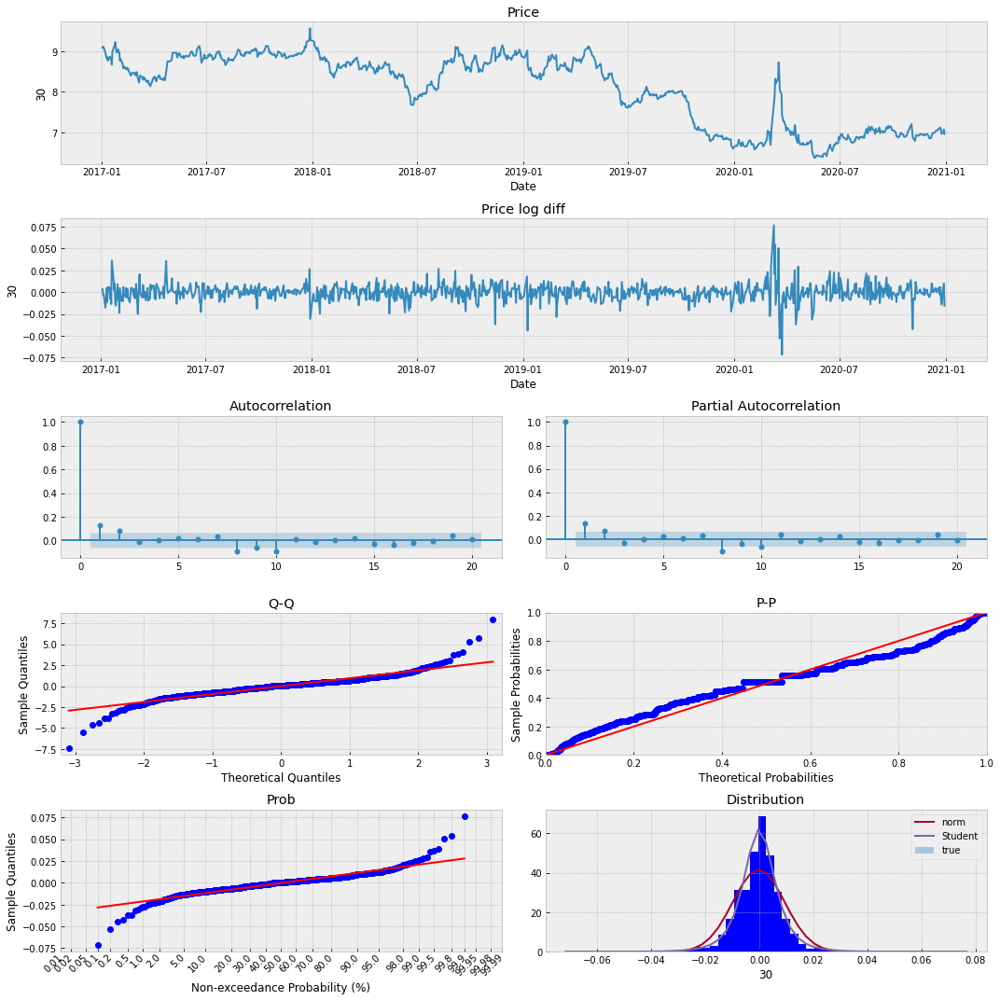

In [12]:
for col in risk_factors.columns:
    risk_factor_describe(risk_factors[col])

# 4. Симуляции риск-факторов

#### Генерация скоррелированных приращений

In [13]:
def get_log(df) -> pd.DataFrame:
    df_log = df.copy()
    for col in df_log.columns:
            df_log[col] = np.log(df_log[col]).diff()
    return df_log.dropna()

In [14]:
def gbm_sim_for_log_diff(PCA, T=10, N=1000): 
    ''' Generate Monte Carlo paths for geometric Brownian motion
    PCAs: DataFrame of noncorrelated features
    T: period for prediction
    N: num of simularions
    Returns
    =======
    paths : ndarray, shape (T, N)
        simulated paths given the parameters
    '''
    return np.vstack((np.full((1, N), fill_value=PCA.iloc[-1]), np.random.normal(loc=PCA.mean(), scale=np.std(PCA), size=(T, N))))

In [15]:
def gbm_sim_for_log_diff_t_dist(PCA, T, N): 
    from scipy.stats import t
    ''' Generate Monte Carlo paths for geometric Brownian motion
    PCAs: DataFrame of noncorrelated features
    T: period for prediction
    N: num of simularions
    Returns
    =======
    paths : ndarray, shape (T, N)
        simulated paths given the parameters
    '''
    df, loc, scale = t.fit(PCA)
    return np.vstack((np.full((1, N), fill_value=PCA.iloc[-1]), t.rvs(df, loc, scale, size=(T, N))))

Рисуем симуляции

In [16]:
def get_plot_simulation(array, df) -> None:
    for i, col in enumerate(df.columns):
        plt.figure(figsize=(9,6))
        plt.xlim(-0.05, array.shape[1]-1)
        plt.title(col, size=18)
        plt.xlabel('time', size=14)
        plt.ylabel('price', size=14)
        plt.plot(array[i])
        plt.show()

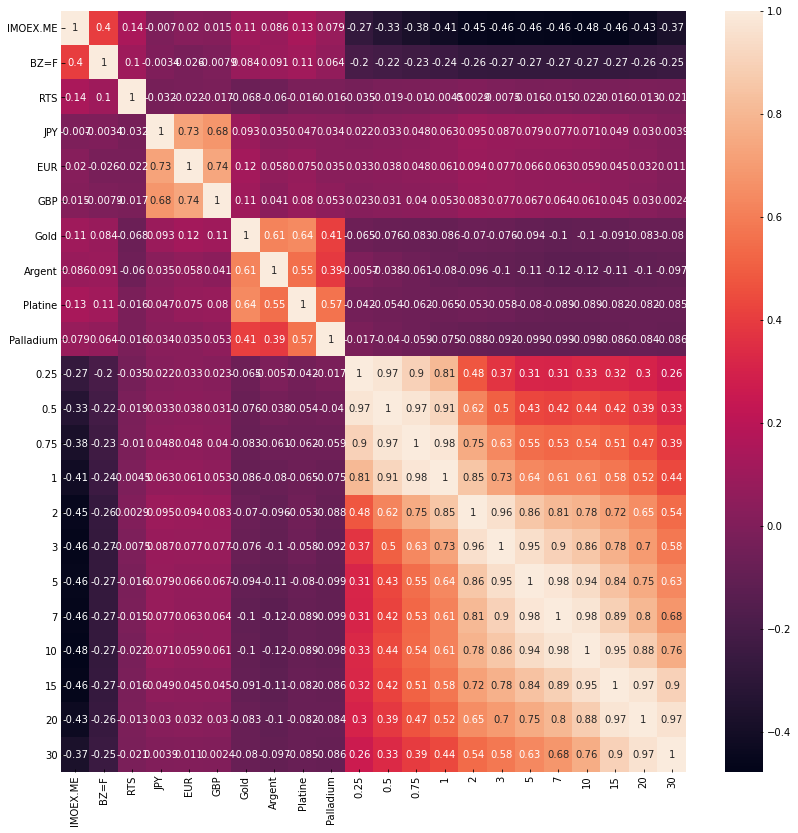

In [17]:
plot_cor_matrix(get_log(risk_factors))

#### *Процентные ставки ~на спорт~*

In [18]:
# risk_factors.columns

In [19]:
interest_rates = risk_factors[['0.25', '0.5', '0.75', 
                              '1', '2', '3', '5', '7', 
                              '10', '15', '20', '30']]
ir_log = get_log(interest_rates)

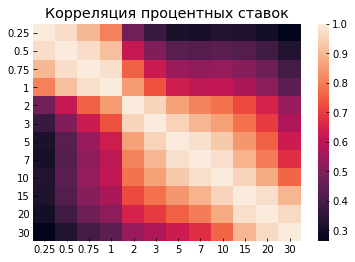

In [20]:
sns.heatmap(ir_log.corr())
plt.title('Корреляция процентных ставок')
plt.show()

In [21]:
for n in range(ir_log.shape[1]-6):
    dim_red = PCA(n_components = n + 1, random_state=42)
    dim_red.fit(ir_log)
    print(" {} component(s)\n explained variance: {}\n".format(n + 1, np.sum(dim_red.explained_variance_ratio_))) 

 1 component(s)
 explained variance: 0.6780849292951865

 2 component(s)
 explained variance: 0.9088894837712045

 3 component(s)
 explained variance: 0.9669646967686475

 4 component(s)
 explained variance: 0.9874861187245191

 5 component(s)
 explained variance: 0.9949896795651655

 6 component(s)
 explained variance: 0.9976056959943999



#### Оставим 3 главные компоненты, так как это минимальное кол-во компонент, объясняюшее больше 95% дисперсии.

In [22]:
PCA_ir = PCA(n_components=3, random_state=42)
ir_pca = pd.DataFrame(PCA_ir.fit_transform(ir_log), 
                      columns=['ir_comp_1', 'ir_comp_2', 'ir_comp_3'])

In [23]:
sim_ir_vas = []
for col in ir_pca.columns:
    sim = gbm_sim_for_log_diff(ir_pca[col], T=10, N=100)
    sim_ir_vas.append(sim)
sim_ir_vas = np.array(sim_ir_vas)

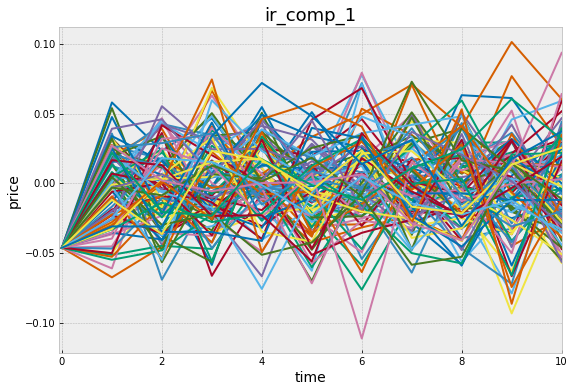

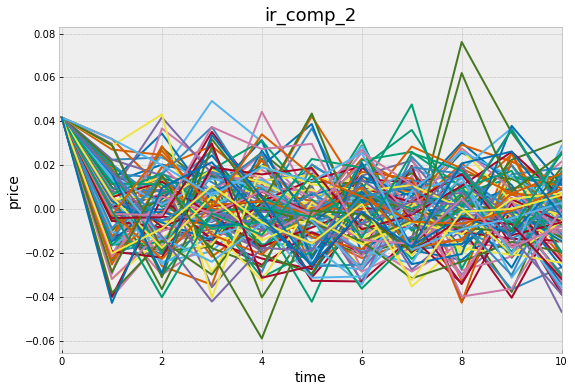

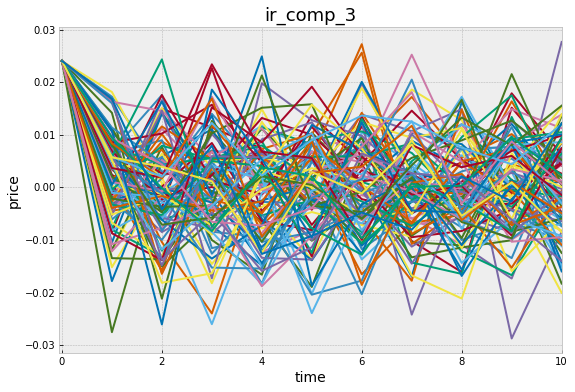

In [24]:
get_plot_simulation(sim_ir_vas, ir_pca)

In [25]:
def get_plot_simulation_sum(array, df) -> None:
    for i, col in enumerate(df.columns):
        plt.figure(figsize=(9,6))
        plt.xlim(-0.05, array.shape[1]-1)
        plt.title(col, size=18)
        plt.xlabel('time', size=14)
        plt.ylabel('price', size=14)
        plt.plot(np.exp(np.cumsum(array[i], axis=0)))
        plt.show()

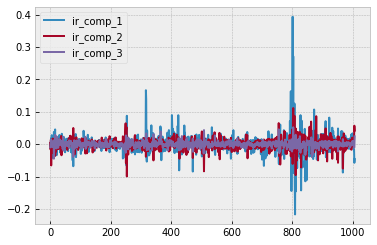

In [26]:
ir_pca.plot();

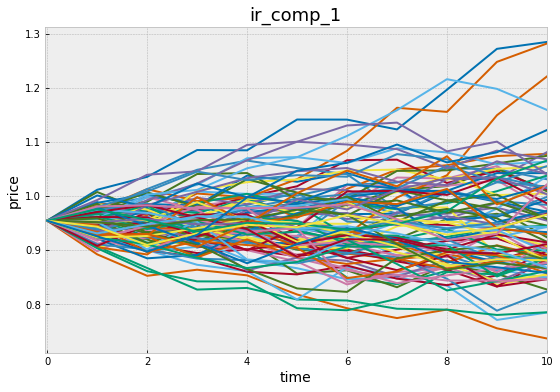

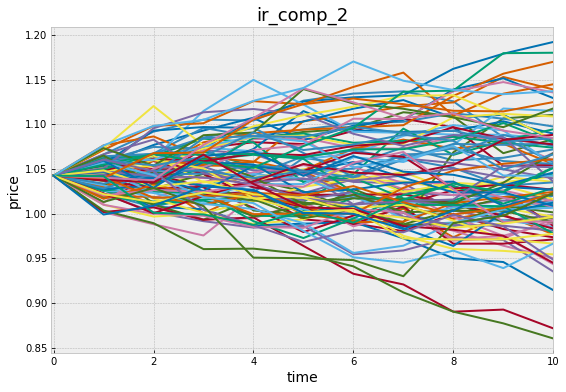

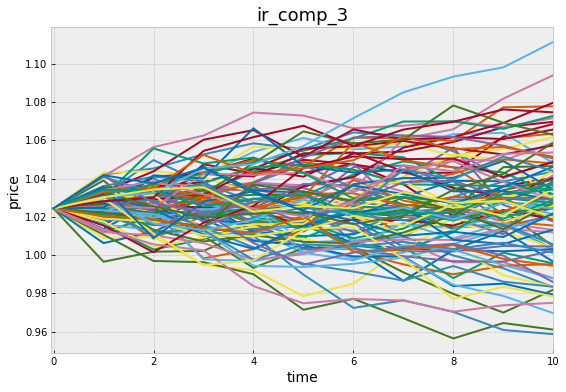

In [27]:
get_plot_simulation_sum(sim_ir_vas, ir_pca)

#### *Драгоценные металы*

In [28]:
metal = risk_factors[['Gold', 'Argent', 'Platine', 'Palladium']]
metal_log = get_log(metal)

In [29]:
metal = risk_factors[['Gold', 'Argent', 'Platine', 'Palladium']]
metal_log = get_log(metal)

sim_met = []
for col in metal_log.columns:
    sim = gbm_sim_for_log_diff(metal_log[col])
    sim_met.append(sim)
sim_met = np.array(sim_met)

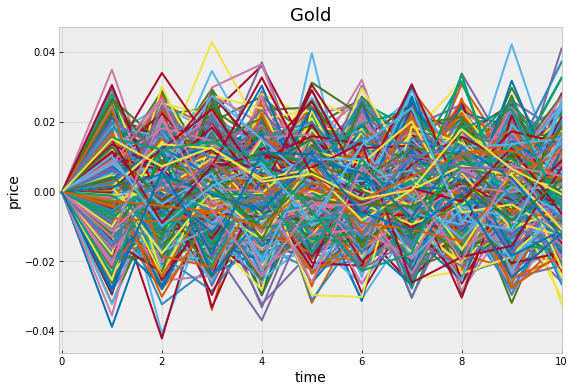

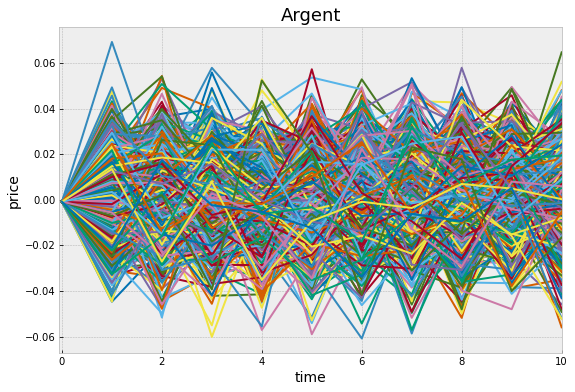

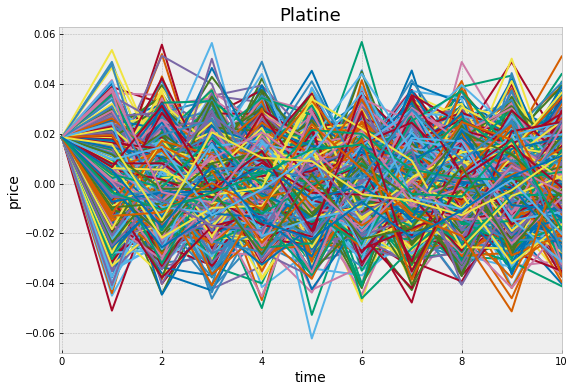

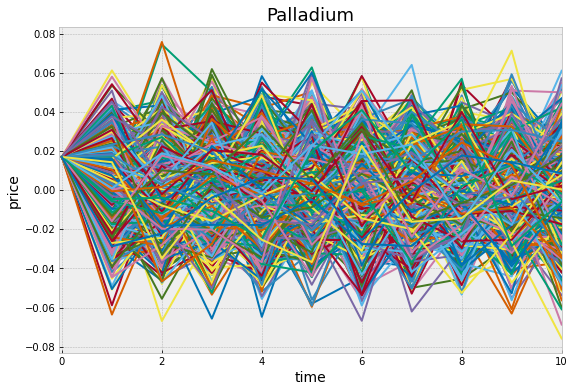

In [30]:
get_plot_simulation(sim_met, metal_log)

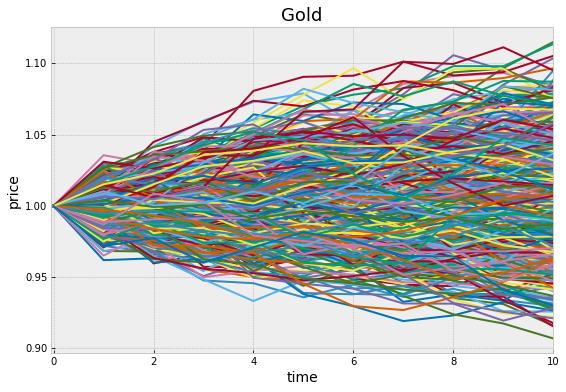

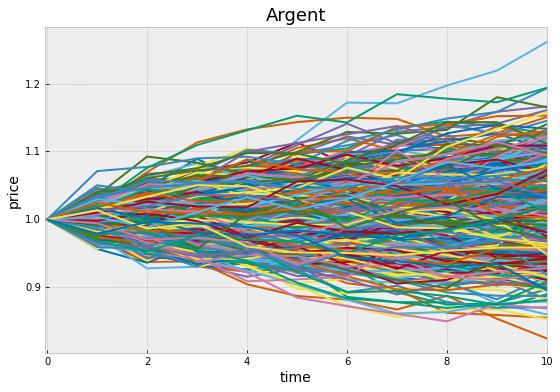

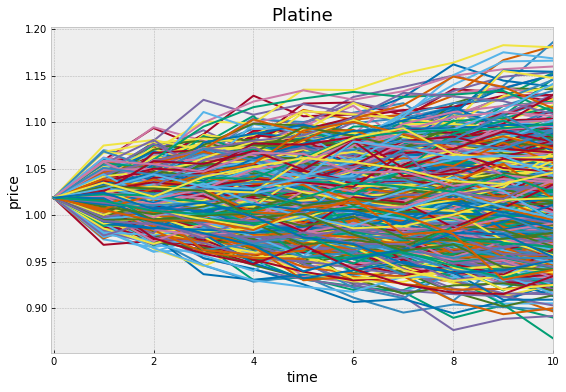

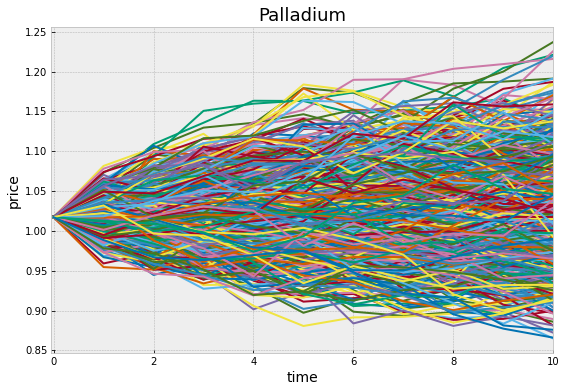

In [31]:
get_plot_simulation_sum(sim_met, metal_log)

#### *Индексы*

In [32]:
idx_df = risk_factors[['IMOEX.ME', 'RTS']]
idx_df_log = get_log(idx_df)

In [33]:
sim_idx = []
for col in idx_df_log.columns:
    sim = gbm_sim_for_log_diff(idx_df_log[col], T=10, N=100)
    sim_idx.append(sim)
sim_idx = np.array(sim_idx)

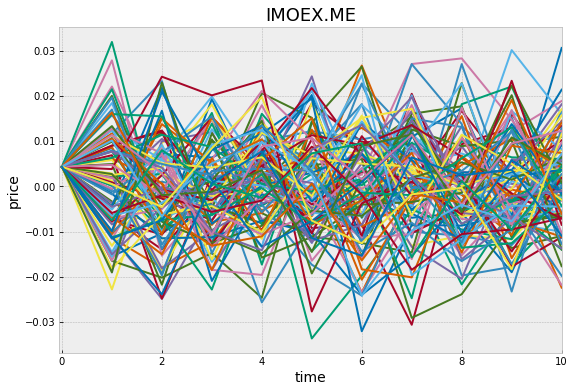

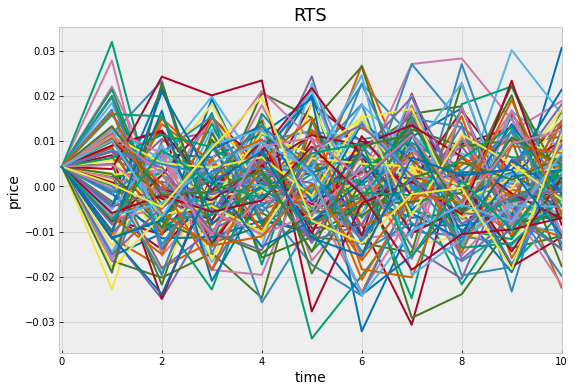

In [34]:
get_plot_simulation(sim_idx, idx_df_log[['IMOEX.ME']])

get_plot_simulation(sim_idx, idx_df_log[['RTS']])

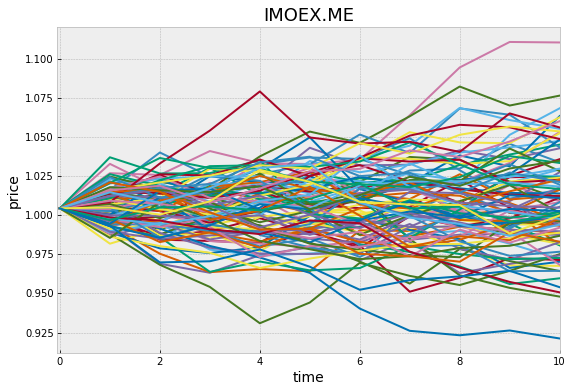

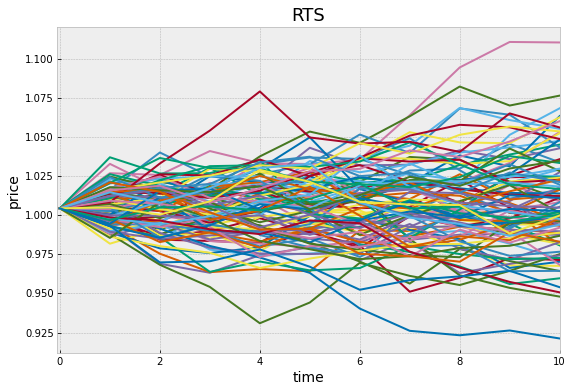

In [35]:
get_plot_simulation_sum(sim_idx, idx_df_log[['IMOEX.ME']])

get_plot_simulation_sum(sim_idx, idx_df_log[['RTS']])

#### *Черное Золото и валюта*

In [36]:
cur_oil = risk_factors[['BZ=F', 'JPY', 'EUR', 'GBP']]
cur_oil_log = get_log(cur_oil)

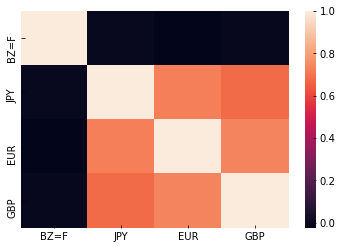

In [37]:
sns.heatmap(cur_oil_log.corr())
plt.show()

In [38]:
pca_dim = PCA(n_components = 2, random_state=42)
cur_oil_pca = pd.DataFrame(pca_dim.fit_transform(cur_oil_log), columns=['cur_oil_comp_1', 'cur_oil_comp_2'])
print("Explained variance ratio: {}".format(np.sum(pca_dim.explained_variance_ratio_)))

Explained variance ratio: 0.9704124318007362


In [39]:
sim_cur_oil = []
for col in cur_oil_pca.columns:
    sim = gbm_sim_for_log_diff(cur_oil_pca[col])
    sim_cur_oil.append(sim)
sim_cur_oil = np.array(sim_cur_oil)

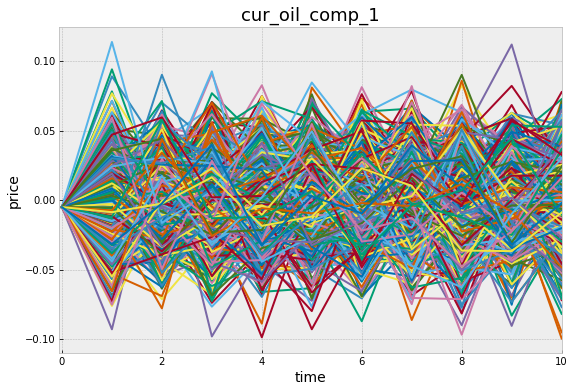

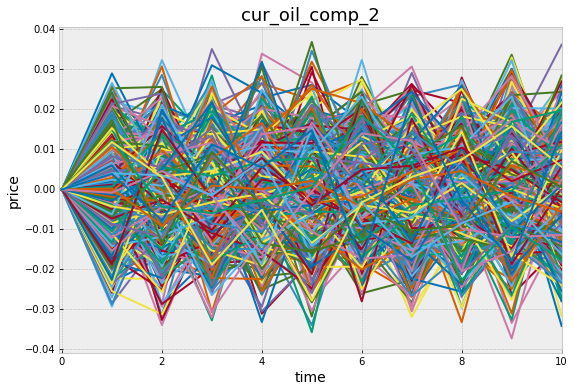

In [40]:
get_plot_simulation(sim_cur_oil, cur_oil_pca)

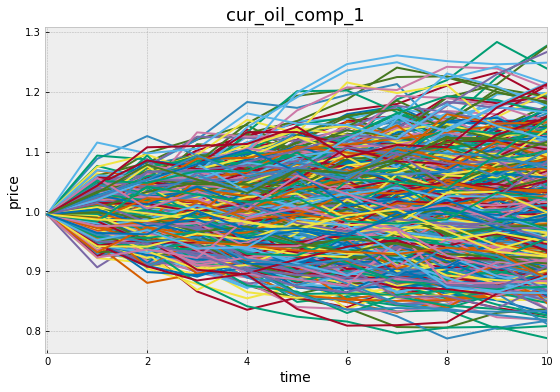

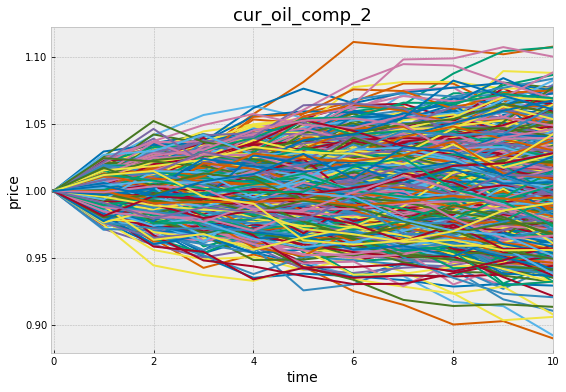

In [41]:
get_plot_simulation_sum(sim_cur_oil, cur_oil_pca)

#### Предсказание 

In [42]:
pca = PCA(n_components = 2, random_state=42)
reduced_indexes = pca.fit_transform(idx_df_log)
print(np.sum(pca.explained_variance_ratio_))
reduced_curr_oil = pca.fit_transform(cur_oil_log)
print(np.sum(pca.explained_variance_ratio_))
reduced_rates = pca.fit_transform(ir_log)
print(np.sum(pca.explained_variance_ratio_))
reduced_metal = pca.fit_transform(metal_log)
print(np.sum(pca.explained_variance_ratio_))

1.0
0.9704124318007362
0.9088894837712045
0.8558776828045839


In [43]:
reduced_data = pd.DataFrame(np.hstack([reduced_indexes, reduced_curr_oil, reduced_rates, reduced_metal]), 
                            columns=['reduced_indexes_1', 'reduced_indexes_2', 
                                     'reduced_curr_oil_1', 'reduced_curr_oil_2', 
                                     'reduced_rates_1', 'reduced_rates_2', 
                                     'reduced_metal_1', 'reduced_metal_2',], 
                            index=idx_df_log.index)

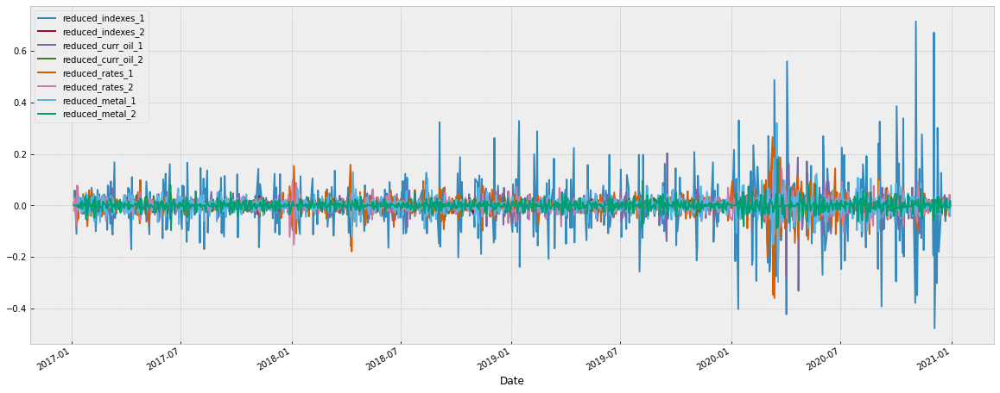

In [44]:
reduced_data.diff().dropna().plot(figsize=(20, 8))
plt.show()

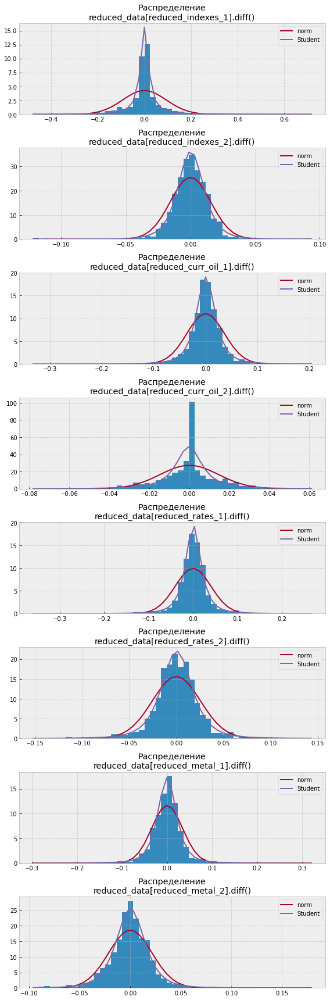

In [45]:
fig, ax = plt.subplots(len(reduced_data.columns), 1, figsize=(8, 24))
for i, col in enumerate(reduced_data.columns):
    r = reduced_data[col].diff().dropna()
    params_norm = ss.norm.fit(r)
    params_t = ss.t.fit(r)
    vals, grid, _ = ax[i].hist(r, 50, density=True)
    ax[i].plot(grid, ss.norm(*params_norm).pdf(grid), label='norm')
    ax[i].plot(grid, ss.t(*params_t).pdf(grid),label='Student');
    ax[i].legend()
    ax[i].set_title(f'Распределение\nreduced_data[{col}].diff()')
    plt.tight_layout()

# 5. Составляем портфель и перебалансируем на каждый день

In [46]:
obligation_coupons_files = ['bonds\SU26205RMFS3.csv', 'bonds\SU26209RMFS5.csv', 'bonds\SU26212RMFS9.csv', 
                            'bonds\SU26215RMFS2.csv', 'bonds\SU26217RMFS8.csv']
def payment_per_day_bonds(obligation_coupons_files=obligation_coupons_files):

    obligation_coupons = []
    for i in range(len(obligation_coupons_files)):
        obligation_coupon = pd.read_csv(obligation_coupons_files[i])
        obligation_coupon.date = pd.to_datetime(obligation_coupon.date)
        days = (obligation_coupon[['date']].iloc[-2] \
                - obligation_coupon[['date']].iloc[-3]).values[0].astype('timedelta64[D]').astype(int)
        payment_per_day = obligation_coupon['payment'].iloc[-2] / days
        obligation_coupons.append(payment_per_day)

    return np.round(obligation_coupons, 5)

In [47]:
def calculate_portfolio_distribution(bonds=bonds, 
                                     shares=shares, 
                                     currencies=currencies):
    
    dirty_bonds = bonds + payment_per_day_bonds()
    df_for_portfolio = dirty_bonds.join((shares, currencies), how='left')
    
    position_0 = np.array([10e6] * 5 + [1e6] * 10 + [10e6] * 2)
    day_prices = df_for_portfolio.iloc[0] 
    true_qty = position_0 / day_prices
    qty = np.round(position_0 / day_prices, 0).astype(int)
    portfolio_qty_shares_true = (true_qty * day_prices) / (true_qty * day_prices).sum()
    
    all_qty = qty
    all_price = day_prices
    
    for t in range(1, df_for_portfolio.shape[0]):
        day_prices = df_for_portfolio.iloc[t-1]
        wts = (qty * day_prices) / np.sum(qty * day_prices)
        delta_wts = portfolio_qty_shares_true / wts
        qty = np.round(qty * delta_wts, 0).astype(int)
        all_qty = np.vstack((all_qty, qty))
        all_price = np.vstack((all_price, day_prices))
    
    number_of_assets = pd.DataFrame(all_qty, columns=df_for_portfolio.columns, index=dirty_bonds.index)
    prices_of_assets = pd.DataFrame(all_price, columns=df_for_portfolio.columns, index=dirty_bonds.index)
    total_sum = pd.DataFrame(all_qty*all_price, columns=df_for_portfolio.columns, index=dirty_bonds.index)
    
    return number_of_assets, prices_of_assets, total_sum

In [48]:
number_of_assets, prices_of_assets, sum_portfolio = calculate_portfolio_distribution()

In [49]:
prices_of_assets

,SU26205RMFS3,SU26209RMFS5,SU26212RMFS9,SU26215RMFS2,SU26217RMFS8,SBER,GAZP,YNDX,MGNT,GMKN,MTSS,PIKK,AFLT,POLY,RSTI,USD,CNY
Date,,,,,,,,,,,,,,,,,
2017-01-03,98.85814,98.60654,91.59323,94.21296,98.30529,115.255280,119.453156,1241.000000,8697.368164,6927.608887,159.468582,247.140640,128.708633,641.651672,1.060553,61.228298,8.817440
2017-01-04,98.85814,98.60654,91.59323,94.21296,98.30529,115.255280,119.453156,1241.000000,8697.368164,6927.608887,159.468582,247.140640,128.708633,641.651672,1.060553,61.228298,8.817440
2017-01-05,98.90794,98.65714,92.24293,94.79156,98.30529,112.586983,119.256218,1240.000000,8600.023438,6893.798828,157.434631,245.614563,125.925385,660.597046,1.069071,60.923000,8.753556
2017-01-06,99.15804,98.60804,92.29303,94.88166,98.30529,109.995453,116.650513,1252.000000,8335.583008,6778.846191,158.163223,243.155853,125.594444,659.600037,1.075143,60.365002,8.716842
2017-01-09,99.20814,98.70794,92.63303,94.59246,98.40549,109.221214,116.726257,1291.000000,8354.746094,6788.989746,156.038177,244.173248,124.151909,652.121338,1.091455,59.401199,8.623993
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-24,101.23724,104.88824,108.12313,105.39176,102.18649,269.070007,211.050003,5108.000000,5112.104004,23340.000000,327.299988,580.799988,69.440002,1700.300049,1.730300,75.878098,11.598254
2020-12-25,101.22524,104.88824,108.14313,105.23176,102.22449,268.850006,205.139999,5000.000000,5159.008789,23230.000000,327.000000,581.200012,69.059998,1692.300049,1.709700,75.020203,11.471681
2020-12-28,101.19724,104.93824,108.18813,105.39176,102.20549,270.700012,205.460007,5048.000000,5229.843750,23362.000000,328.500000,587.000000,68.919998,1696.900024,1.713500,74.029999,11.338643


In [50]:
number_of_assets

,SU26205RMFS3,SU26209RMFS5,SU26212RMFS9,SU26215RMFS2,SU26217RMFS8,SBER,GAZP,YNDX,MGNT,GMKN,MTSS,PIKK,AFLT,POLY,RSTI,USD,CNY
Date,,,,,,,,,,,,,,,,,
2017-01-03,101155,101413,109178,106143,101724,8676,8371,806,115,144,6271,4046,7769,1558,942905,163323,1134116
2017-01-04,101152,101410,109175,106139,101721,8676,8371,806,115,144,6271,4046,7769,1558,942875,163318,1134081
2017-01-05,101067,101324,108370,105456,101687,8879,8382,806,116,145,6350,4070,7938,1513,935051,164082,1141976
2017-01-06,100577,101138,108058,105110,101449,9067,8549,797,120,147,6305,4101,7941,1512,927596,165211,1144105
2017-01-09,100249,100757,107365,105141,101067,9106,8520,770,119,146,6374,4073,8011,1525,911219,167430,1153241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-24,122616,118348,114807,117783,121477,4613,5882,243,243,53,3793,2137,17876,730,717410,163596,1070277
2020-12-25,122165,117899,114350,117514,120971,4600,6028,247,240,53,3782,2128,17906,731,723296,164838,1077975
2020-12-28,121928,117581,114049,117075,120725,4558,6005,244,236,53,3756,2102,17903,727,720092,166673,1088205


In [51]:
num_overall = number_of_assets.sum(axis=1)
num_overall = num_overall.repeat(repeats = number_of_assets.shape[1]).values.reshape((-1, number_of_assets.shape[1]))

In [52]:
num_overall = pd.DataFrame(num_overall)
num_overall.columns = number_of_assets.columns
num_overall.index = number_of_assets.index

Разделим по видам активов

In [53]:
num_bonds = number_of_assets.iloc[:, 0:5]
num_shares = number_of_assets.iloc[:, 5:15]
num_currencies = number_of_assets.iloc[:, 15:17] 

bonds_ = prices_of_assets.iloc[:, 0:5]
shares_ = prices_of_assets.iloc[:, 5:15]
currencies_ = prices_of_assets.iloc[:, 15:17]  

# риск факторы для подпортфелей
rf_bonds = risk_factors[['IMOEX.ME', 'RTS', 'Gold', 'Argent', 'Platine', 'Palladium', 
                         '0.25', '0.5', '0.75', '1', '2', '3', '5', '7', '10', '15', '20', '30']]
rf_shares = rf_bonds.copy()
rf_currencies = risk_factors[['BZ=F', 'JPY', 'EUR', 'GBP']]

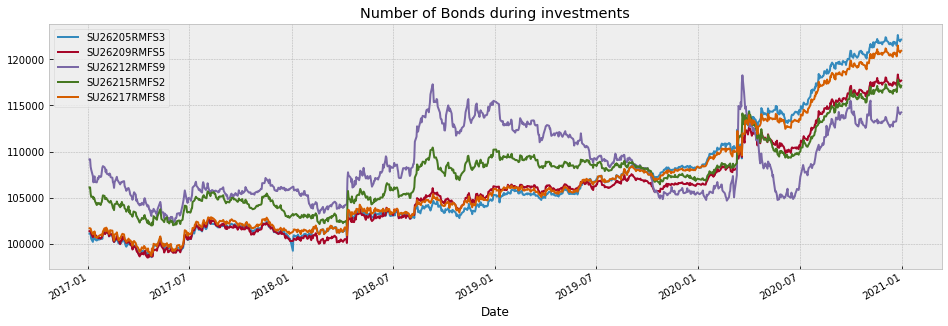

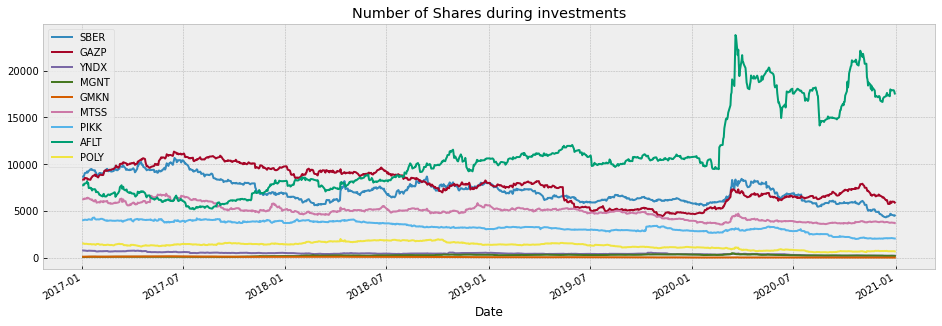

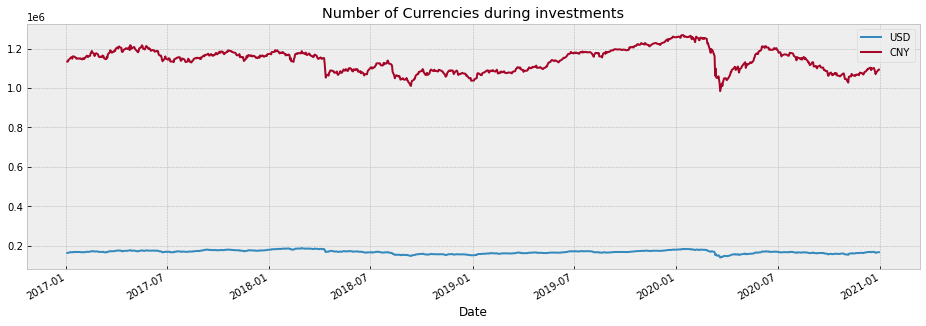

In [54]:
num_bonds.plot(figsize=(16, 5))
plt.title('Number of Bonds during investments')
plt.show()

num_shares.drop('RSTI', axis=1).plot(figsize=(16, 5))
plt.title('Number of Shares during investments')
plt.show()

num_currencies.plot(figsize=(16, 5))
plt.title('Number of Currencies during investments')
plt.show()

In [55]:
risk_factors

,IMOEX.ME,BZ=F,RTS,JPY,EUR,GBP,Gold,Argent,Platine,Palladium,...,0.75,1,2,3,5,7,10,15,20,30
Date,,,,,,,,,,,,,,,,,,,,,
2017-01-03,2285.429932,55.470001,1109.39,0.521610,64.056503,75.184998,2264.82,31.68,1869.86,1455.83,...,8.43,8.40,8.25,8.21,8.22,8.28,8.42,8.66,8.85,9.09
2017-01-04,2263.899902,56.459999,1109.39,0.517870,63.111469,74.559998,2264.82,31.68,1869.86,1455.83,...,8.43,8.39,8.18,8.14,8.19,8.29,8.44,8.69,8.88,9.12
2017-01-05,2220.350098,56.889999,1109.39,0.514930,62.432350,74.359001,2264.82,31.68,1869.86,1455.83,...,8.42,8.37,8.17,8.13,8.16,8.24,8.37,8.63,8.84,9.09
2017-01-06,2213.929932,57.099998,1045.63,0.514980,62.352619,73.753998,2264.82,31.68,1869.86,1455.83,...,8.36,8.35,8.24,8.17,8.15,8.21,8.35,8.60,8.80,9.06
2017-01-09,2211.250000,54.939999,1100.58,0.509430,62.233082,73.193001,2264.82,31.68,1869.86,1455.83,...,8.56,8.49,8.23,8.16,8.11,8.12,8.21,8.43,8.63,8.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-24,3236.879883,51.200001,1378.33,0.566937,69.389999,81.236923,4529.59,62.52,2459.96,5667.14,...,4.32,4.39,4.70,5.03,5.54,5.89,6.27,6.65,6.85,7.06
2020-12-25,3236.879883,51.200001,1378.36,0.566937,69.389999,81.236923,4505.61,60.91,2456.66,5601.48,...,4.30,4.37,4.68,5.00,5.51,5.88,6.26,6.61,6.79,6.96
2020-12-28,3258.949951,50.860001,1391.31,0.566937,69.389999,81.236923,4505.61,60.91,2456.66,5601.48,...,4.25,4.33,4.65,4.97,5.49,5.86,6.26,6.63,6.82,7.00


In [56]:
def get_VaR_ES(data, num_assets, risk_factors, num_sims, L_history = 150, horizon = 1):

    rr = get_log(data).dropna()
 
    risk_factors = get_log(risk_factors).dropna()
    
    #w = num_assets.div(pd.DataFrame(num_assets.sum(axis=1)).values, axis=1)#.T #/(data*num_assets).sum(axis=1).values).T
#.T #/(data*num_assets).sum(axis=1).values).T
    #w_port = 
    #w = (num_assets * data).div((num_assets * data).sum(axis=0))
    w = (num_assets * data).div(pd.DataFrame((num_assets * data).sum(axis=1)).values)
        
    VaR, VaR_for_ES, ES = np.full(rr.shape, np.nan), np.full(rr.shape, np.nan), np.full(rr.shape, np.nan)
    for j, col in enumerate(rr):
        r = rr[col]
        for i in tqdm(range(L_history, len(r)-1)):  
            
            history = r[i - L_history: i+1]
            
            if risk_factors.shape[1] > 4:
                dim_red = PCA(n_components = 5, random_state=42)
                risk_factors_ = risk_factors.iloc[i - L_history: i+1] 
                risk_factors_ = pd.DataFrame(dim_red.fit_transform(risk_factors_), 
                          columns=['ir_comp_1', 'ir_comp_2', 'ir_comp_3', 'ir_comp_4', 'ir_comp_5']) 
            else: 
                dim_red = PCA(n_components = 2, random_state=42)
                risk_factors_ = risk_factors.iloc[i - L_history: i+1] 
                risk_factors_ = pd.DataFrame(dim_red.fit_transform(risk_factors_), 
                          columns=['ir_comp_1', 'ir_comp_2']) 
            paths_dict = dict()
            for col in risk_factors_.columns:
                paths_dict[col] = gbm_sim_for_log_diff_t_dist(risk_factors_[col], T=horizon, N=num_sims).sum(axis=0)
            
            sims = pd.DataFrame(np.array(list(paths_dict.values())).squeeze().T,
                        index=range(num_sims), columns = risk_factors_.columns)
            
            
            GB = GradientBoostingRegressor(random_state=42)
            GB.fit(risk_factors_, history)
            pred = GB.predict(sims)
            
            
            VaR[i+1, j] = np.quantile(pred, 0.01) 
            VaR_for_ES[i+1, j] = np.quantile(pred, 0.025)
            ES[i+1, j] = history[history <= VaR_for_ES[i+1, j]].mean()

                
    VaR_per_asset = pd.DataFrame(data=VaR, index=rr.index) 
    ES_per_asset = pd.DataFrame(data=ES, index=rr.index)    

    VaR_per_asset.columns = w.columns 
    ES_per_asset.columns = w.columns
    
    VaR = pd.Series(data=(VaR_per_asset * w).sum(axis=1), index=rr.index)
    VaR[VaR == 0] = np.nan
    ES = pd.Series(data=(ES_per_asset * w).sum(axis=1), index=rr.index)    
    ES[ES == 0] = np.nan

    
    
    return VaR, ES, VaR_per_asset, ES_per_asset

In [57]:
def plot_VaR_ES(data, VaR, ES, num_assets, L_history=180, plot_title=''):
    
    rr = get_log(data).dropna()
    w = (num_assets * data).div(pd.DataFrame((num_assets * data).sum(axis=1)).values)
    #w = num_assets.div(pd.DataFrame(num_assets.sum(axis=1)).values, axis=1)
    #w = ((data*num_assets).T/(data*num_assets).sum(axis=1).values).T[:-1]
    
    VaR.columns = w.columns
    ES.columns = w.columns
    
    plt.figure(figsize=(16, 8))
    lr = pd.DataFrame((rr * w).sum(axis=1))
    plt.plot(lr, alpha=1, label='Daily Weighted Log Returns')
    var = pd.DataFrame((VaR * w).sum(axis=1)[L_history+1:])
    var[var == 0.] = np.nan
    plt.plot(var, color='red', label='VaR', alpha=0.3)
    es = pd.DataFrame((ES * w).sum(axis=1)[L_history+1:])
    es[es == 0.] = np.nan
    plt.plot(es, color='blue', label='ES', alpha=0.3)
    #plt.ylim(-0.025, 0.025)
    plt.title(plot_title)
    plt.legend()
    plt.show()

In [58]:
def plot_real_values(data, num_assets, VaR_per_1, VaR_per_10, title):
    VaR_port = np.exp(VaR_per_1)
    VaR_per_10 = np.exp(VaR_per_10)
    VaR_port = (VaR_port * data.shift(1) * num_assets).sum(axis=1)
    VaR_per_10 = (VaR_per_10 * data.shift(1) * num_assets).sum(axis=1)
    VaR_port[VaR_port == 0] = np.nan
    VaR_per_10[VaR_per_10 == 0] = np.nan

    A_port = (data * num_assets).sum(axis=1)
    
#     print('Горизонт 1 день:')
#     print(f'{(A_port < VaR_port).astype(int).sum()} пробитий из {VaR_port.shape[0]} возможных')
#     print(f'Доля пробития составляет {np.round((A_port < VaR_port).astype(int).sum() / VaR_port.shape[0] * 100, 2)}%')
#     print('---------------------------------------------------------------------------------------------------')
#     print('Горизонт 10 день:')
#     print(f'{(A_port < VaR_per_10).astype(int).sum()} пробитий из {VaR_per_10.shape[0]} возможных')
#     print(f'Доля пробития составляет {np.round((A_port < VaR_per_10).astype(int).sum() / VaR_per_10.shape[0] * 100, 2)}%')
    
    plt.figure(figsize=(16, 12))
    plt.title(title)
    plt.plot(A_port, label='Portfolio')
    plt.plot(VaR_port, label='VaR, h=1', alpha=0.35)
    plt.plot(VaR_per_10, label='VaR, h=10', alpha=0.35)
    plt.legend(loc='upper left')
    plt.show()    

In [59]:
def bern_test(p, v):
    
    lv = len(v)
    sv = sum(v)
    al = np.log(p)*sv + np.log(1-p)*(lv-sv)
    
    bl = np.log(sv/lv)*sv + np.log(1-sv/lv)*(lv-sv)
    
    return (-2*(al-bl))


def ind_test(V):
    
    J = np.full([len(V),4], 0)
    for i in range(1,len(V)-1):
        J[i,0] = (V[i-1] == 0) & (V[i] == 0)
        J[i,1] = (V[i-1] == 0) & (V[i] == 1)
        J[i,2] = (V[i-1] == 1) & (V[i] == 0)
        J[i,3] = (V[i-1] == 1) & (V[i] == 1)
        
    V_00 = sum(J[:,0])
    V_01 = sum(J[:,1])
    V_10 = sum(J[:,2])
    V_11 = sum(J[:,3])
    p_00=V_00/(V_00+V_01)
    p_01=V_01/(V_00+V_01)
    p_10=V_10/(V_10+V_11)
    p_11=V_11/(V_10+V_11)
    hat_p = (V_01+V_11)/(V_00+V_01+V_10+V_11)
    al = np.log(1-hat_p)*(V_00+V_10) + np.log(hat_p)*(V_01+V_11)
    bl = np.log(p_00)*V_00 + np.log(p_01)*V_01 + np.log(p_10)*V_10 + np.log(p_11)*V_11
    
    return (-2*(al-bl))


def backtest_results(ret, var_curve, alpha, significance=0.95):
    
    idx = var_curve.notna()
    
    violations = ret[idx] < var_curve[idx]
    
    coverage = bern_test(p=alpha, v=violations) < ss.chi2.ppf(significance, 1)
    independence = ind_test(violations) < ss.chi2.ppf(significance, 1)
        
    print('Target share of violations: {:.2f}%'.format(100*alpha))
    print('Observed share of violations: {:.2f}%'.format(100*violations.mean()))
    
    print('')
    
    if coverage:
        print('Test for coverage is passed')
    else:
        print('Test for coverage isn\'t passed')
        
    print('')
        
    if independence:
        print('Test for independence is passed')
    else:
        print('Test for independence isn\'t passed')

### Облигации

In [60]:
# 1 день
bonds_VaR_1, bonds_ES_1, bonds_VaR_per_1, bonds_ES_per_1 \
= get_VaR_ES(bonds_, num_bonds, rf_bonds, 5000, L_history = 180, horizon=1)

100%|██████████| 826/826 [04:04<00:00,  3.38it/s]


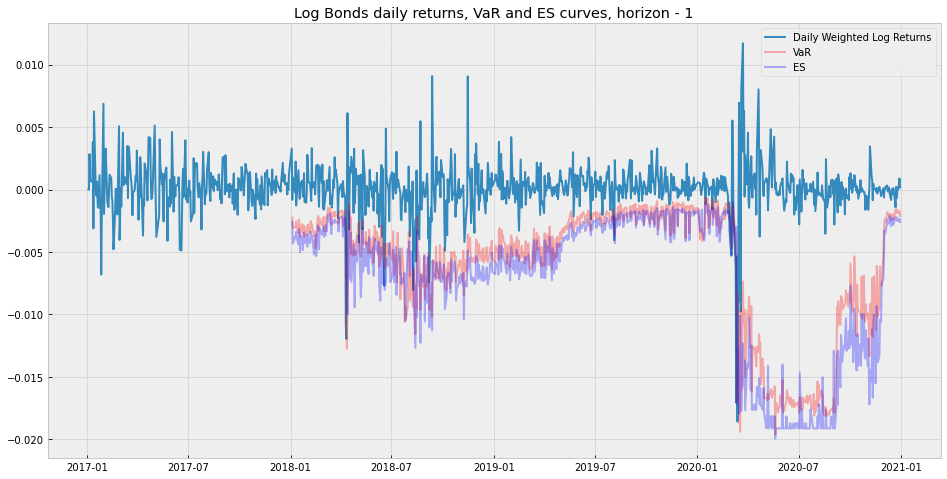

In [61]:
plot_VaR_ES(bonds_, bonds_VaR_per_1, bonds_ES_per_1, num_bonds, L_history=252,
            plot_title ='Log Bonds daily returns, VaR and ES curves, horizon - 1')

In [62]:
w_bonds = (num_bonds * bonds_).div(pd.DataFrame((num_bonds * bonds_).sum(axis=1)).values)

In [63]:
backtest_results((get_log(bonds_) * w_bonds.iloc[1:,:]).sum(axis=1), bonds_VaR_1, alpha=0.01)

Target share of violations: 1.00%
Observed share of violations: 2.30%

Test for coverage isn't passed

Test for independence isn't passed


In [64]:
# 10 дней
bonds_VaR_10, bonds_ES_10, bonds_VaR_per_10, bonds_ES_per_10 \
= get_VaR_ES(bonds_, num_bonds, rf_bonds, 5000, L_history = 180, horizon=10)

100%|██████████| 826/826 [04:27<00:00,  3.09it/s]


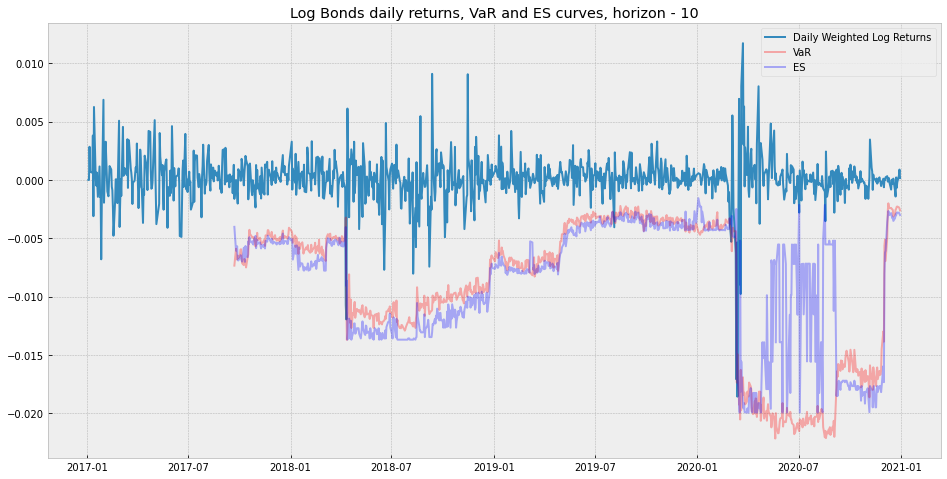

In [65]:
plot_VaR_ES(bonds_, bonds_VaR_per_10, bonds_ES_per_10, num_bonds, L_history=180,
            plot_title ='Log Bonds daily returns, VaR and ES curves, horizon - 10')

In [66]:
backtest_results((get_log(bonds_) * num_bonds.div(pd.DataFrame(num_bonds.sum(axis=1)).values, axis=1)).sum(axis=1)[1:],
                 bonds_VaR_10, alpha=0.01)

Target share of violations: 1.00%
Observed share of violations: 0.85%

Test for coverage is passed

Test for independence isn't passed


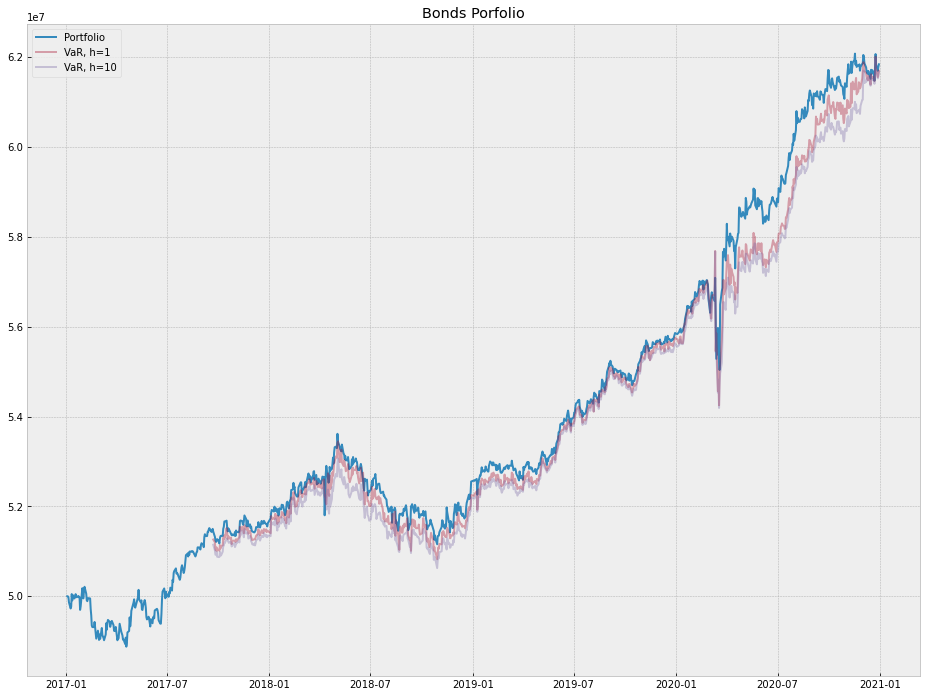

In [67]:
plot_real_values(bonds_, num_bonds, bonds_VaR_per_1, bonds_VaR_per_10, 'Bonds Porfolio')

### Акции

In [68]:
# 1 день
shares_VaR_1, shares_ES_1, shares_VaR_per_1, shares_ES_per_1 \
= get_VaR_ES(shares_, num_shares, rf_shares, 5000, L_history = 180, horizon=1)

100%|██████████| 826/826 [04:01<00:00,  3.42it/s]


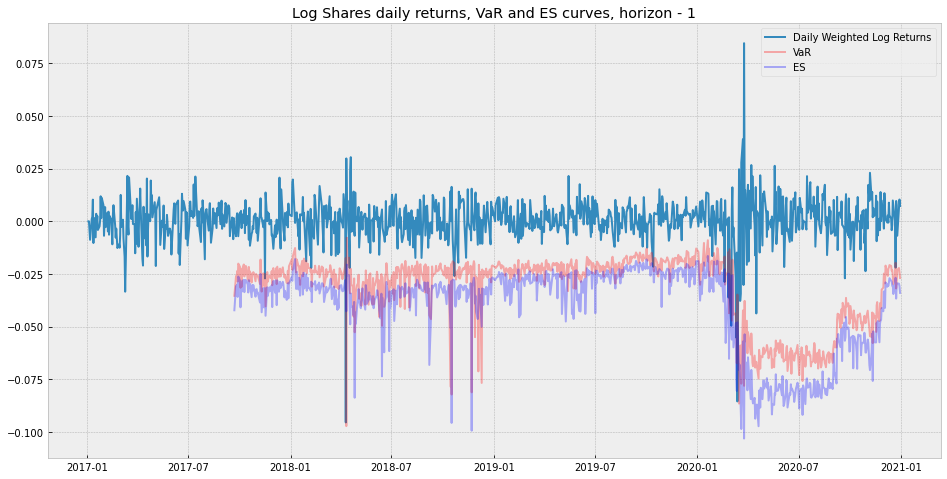

In [69]:
plot_VaR_ES(shares_, shares_VaR_per_1, shares_ES_per_1, num_shares, L_history=180,
            plot_title ='Log Shares daily returns, VaR and ES curves, horizon - 1')

In [70]:
w_shares = (num_shares * shares_).div(pd.DataFrame((num_shares * shares_).sum(axis=1)).values)

In [71]:
backtest_results((get_log(shares_) * w_shares.iloc[1:,:]).sum(axis=1), shares_VaR_1, alpha=0.01)

Target share of violations: 1.00%
Observed share of violations: 1.45%

Test for coverage is passed

Test for independence is passed


In [72]:
# 10 день
shares_VaR_10, shares_ES_10, shares_VaR_per_10, shares_ES_per_10 \
= get_VaR_ES(shares_, num_shares, rf_shares, 5000, L_history = 180, horizon = 10 )

100%|██████████| 826/826 [5:11:14<00:00, 22.61s/it]      


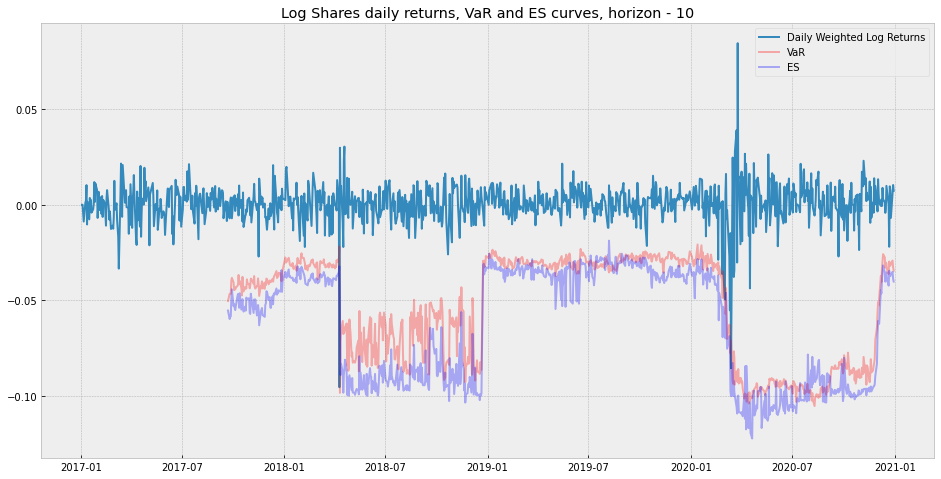

In [73]:
plot_VaR_ES(shares_, shares_VaR_per_10, shares_ES_per_10, num_shares, L_history=180,
             plot_title ='Log Shares daily returns, VaR and ES curves, horizon - 10')

In [74]:
backtest_results((get_log(shares_) * w_shares.iloc[1:,:]).sum(axis=1), shares_VaR_10, alpha=0.01)

Target share of violations: 1.00%
Observed share of violations: 0.24%

Test for coverage isn't passed

Test for independence isn't passed


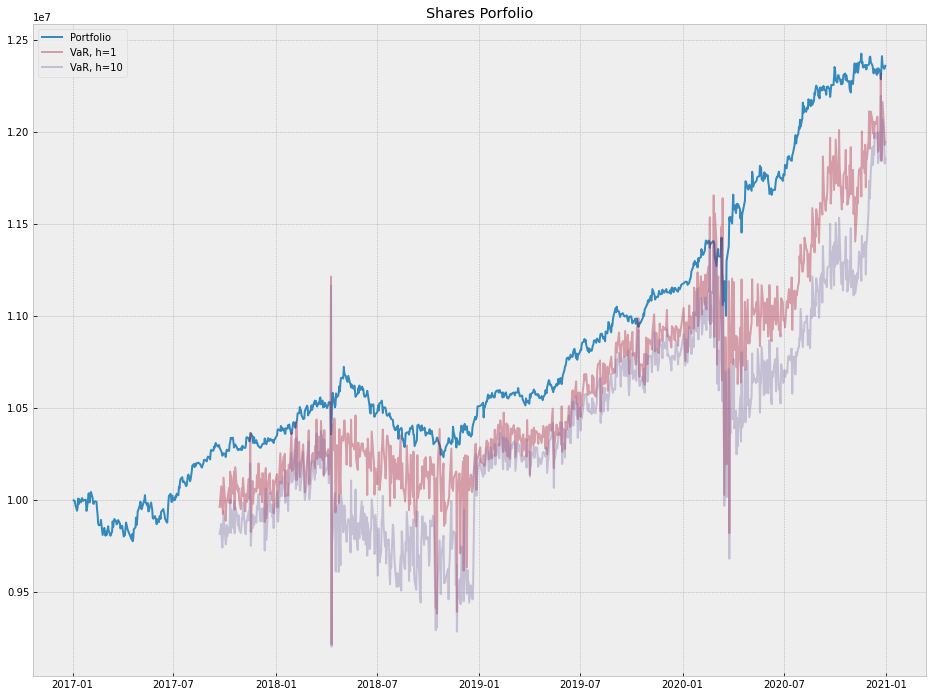

In [75]:
plot_real_values(shares_, num_shares, shares_VaR_per_1, shares_VaR_per_10, 'Shares Porfolio')

### Валюты

In [76]:
# 1 день
currencies_VaR_1, currencies_ES_1, currencies_VaR_per_1, currencies_ES_per_1 \
= get_VaR_ES(currencies_, num_currencies, rf_currencies, 5000, L_history = 180, horizon=1)

100%|██████████| 826/826 [02:05<00:00,  6.59it/s]


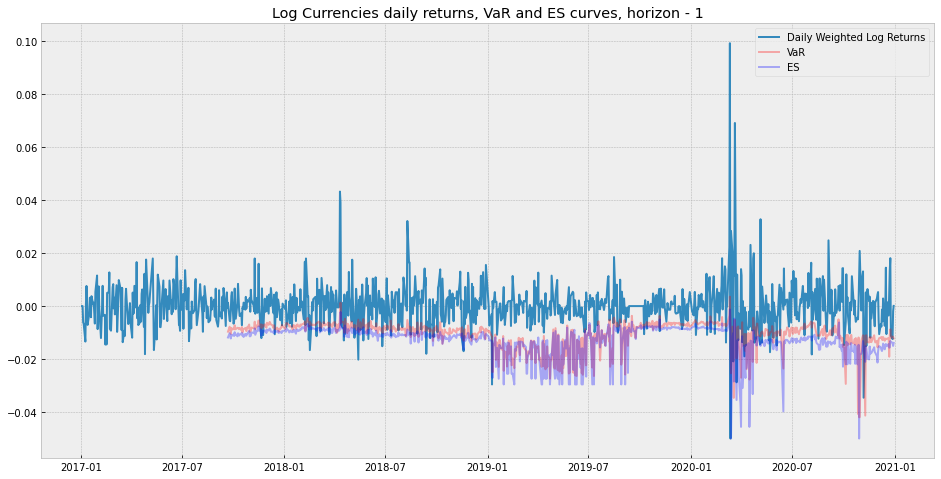

In [77]:
plot_VaR_ES(currencies_, currencies_VaR_per_1, currencies_ES_per_1, num_currencies, L_history=180,
            plot_title ='Log Currencies daily returns, VaR and ES curves, horizon - 1')

In [78]:
w_currencies = (num_currencies * currencies_).div(pd.DataFrame((num_currencies * currencies_).sum(axis=1)).values)

In [79]:
backtest_results((get_log(currencies_) * w_currencies.iloc[1:,:]).sum(axis=1), currencies_VaR_1, alpha=0.01)

Target share of violations: 1.00%
Observed share of violations: 8.96%

Test for coverage isn't passed

Test for independence is passed


In [80]:
# 10 день
currencies_VaR_10, currencies_ES_10, currencies_VaR_per_10, currencies_ES_per_10 \
= get_VaR_ES(currencies_, num_currencies, rf_currencies, 5000, L_history = 180, horizon=10)

100%|██████████| 826/826 [02:14<00:00,  6.12it/s]


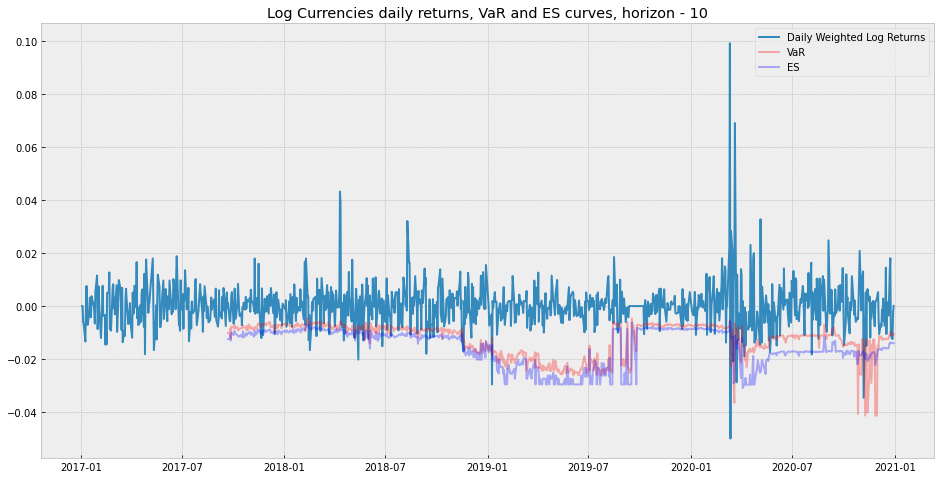

In [81]:
plot_VaR_ES(currencies_, currencies_VaR_per_10, currencies_ES_per_10, num_currencies, L_history=180,
            plot_title ='Log Currencies daily returns, VaR and ES curves, horizon - 10')

In [82]:
backtest_results((get_log(currencies_) * w_currencies.iloc[1:,:]).sum(axis=1), currencies_VaR_10, alpha=0.01)

Target share of violations: 1.00%
Observed share of violations: 7.75%

Test for coverage isn't passed

Test for independence is passed


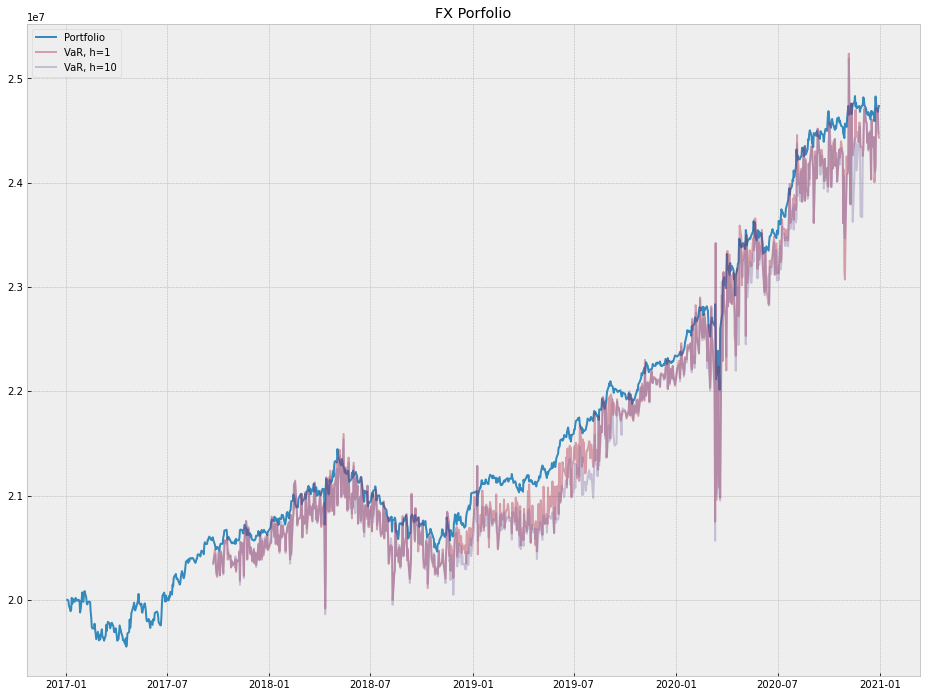

In [83]:
plot_real_values(currencies_, num_currencies, currencies_VaR_per_1, currencies_VaR_per_10, 'FX Porfolio')

### Портфель

In [84]:
all_w = (number_of_assets * prices_of_assets).div(pd.DataFrame((number_of_assets * prices_of_assets).sum(axis=1)).values)

In [85]:
all_VaR_per_1 = bonds_VaR_per_1.merge(shares_VaR_per_1, left_index=True, right_index=True)\
                                            .merge(currencies_VaR_per_1, left_index=True, right_index=True)
all_ES_per_1 = bonds_VaR_per_1.merge(shares_ES_per_1, left_index=True, right_index=True)\
                                            .merge(currencies_ES_per_1, left_index=True, right_index=True)
all_VaR_1 = (all_VaR_per_1 * all_w.iloc[1:,:]).sum(axis=1)
all_VaR_1[all_VaR_1 == 0] = np.nan

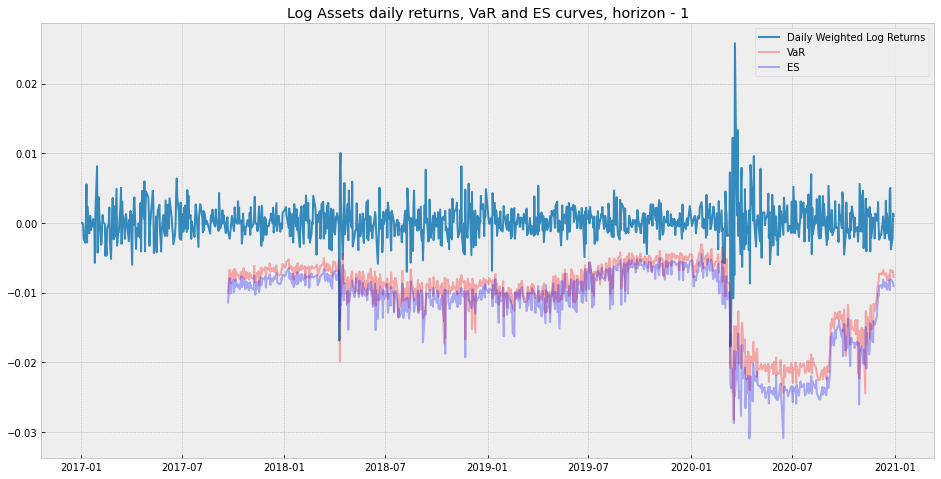

In [86]:
plot_VaR_ES(prices_of_assets, all_VaR_per_1, all_ES_per_1, number_of_assets, L_history=180,
            plot_title ='Log Assets daily returns, VaR and ES curves, horizon - 1')

In [87]:
backtest_results((get_log(prices_of_assets) * all_w.iloc[1:,:]).sum(axis=1), all_VaR_1, alpha=0.01)

Target share of violations: 1.00%
Observed share of violations: 0.36%

Test for coverage isn't passed

Test for independence isn't passed


In [88]:
all_VaR_per_10 = bonds_VaR_per_10.merge(shares_VaR_per_10, left_index=True, right_index=True)\
                                            .merge(currencies_VaR_per_10, left_index=True, right_index=True)
all_ES_per_10 = bonds_VaR_per_10.merge(shares_ES_per_10, left_index=True, right_index=True)\
                                            .merge(currencies_ES_per_10, left_index=True, right_index=True)
all_VaR_10 = (all_VaR_per_10 * all_w.iloc[1:,:]).sum(axis=1)
all_VaR_10[all_VaR_10 == 0] = np.nan

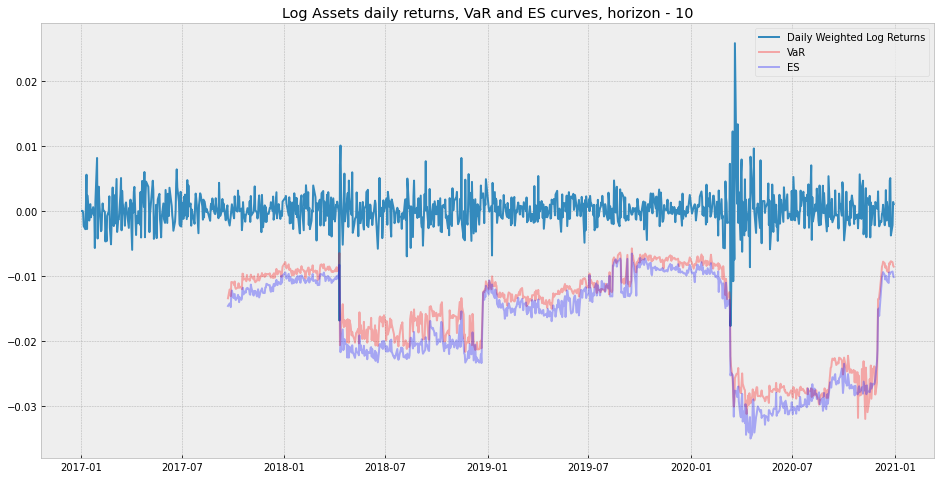

In [89]:
plot_VaR_ES(prices_of_assets, all_VaR_per_10, all_ES_per_10, number_of_assets, L_history=180,
            plot_title ='Log Assets daily returns, VaR and ES curves, horizon - 10')

In [90]:
backtest_results((get_log(prices_of_assets) * all_w.iloc[1:,:]).sum(axis=1), all_VaR_10, alpha=0.01)

Target share of violations: 1.00%
Observed share of violations: 0.12%

Test for coverage isn't passed

Test for independence isn't passed


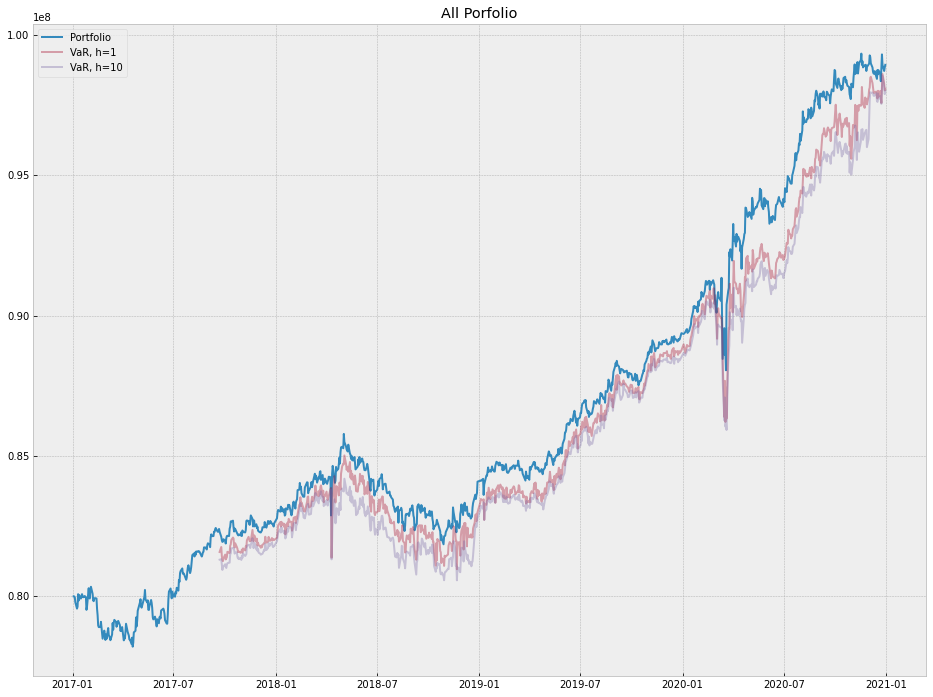

In [91]:
plot_real_values(prices_of_assets, number_of_assets, all_VaR_per_1, all_VaR_per_10, 'All Porfolio')